<div style="
    background: linear-gradient(135deg, #667eea 0%, #764ba2 100%);
    padding: 40px 30px 40px 0px;
    border-radius: 15px;
    color: white;
    margin-bottom: 30px;
    box-shadow: 0 10px 30px rgba(0,0,0,0.2);
">

<div style="
    display: grid;
    grid-template-columns: 1fr 3fr 1fr;
    align-items: center;
    max-width: 1000px;
    margin: 0 auto;
">

<!-- Course Info (Left) -->
<div style="text-align: left;">
    <div style="
        background: rgba(255,255,255,0.2);
        padding: 8px 15px;
        border-radius: 20px;
        display: inline-block;
        font-weight: bold;
        margin-bottom: 5px;
    ">IM5022</div>
    <div style="font-size: 0.9em; opacity: 0.9;">Machine Learning</div>
</div>

<!-- Main Title (Center) -->
<div style="text-align: center;">
    <h1 style="
        font-size: 2.2em;
        margin: 0 0 15px 0;
        font-weight: bold;
        text-shadow: 2px 2px 4px rgba(0,0,0,0.3);
    ">Predicting Credit Card Default Using Machine Learning</h1>
    <h2 style="
        font-size: 1.3em;
        margin: 0;
        font-weight: normal;
        font-style: italic;
        opacity: 0.9;
    ">A Comparative Study of Classification Algorithms</h2>
</div>

<!-- Student Info (Right) -->
<div style="text-align: right;">
    <div style="
        background: rgba(255,255,255,0.2);
        padding: 8px 15px;
        border-radius: 20px;
        display: inline-block;
        margin-bottom: 8px;
        font-size: 0.9em;
    ">Student ID: MS25947816</div>
    <br>
    <div style="
        background: rgba(255,255,255,0.2);
        padding: 8px 15px;
        border-radius: 20px;
        display: inline-block;
        font-size: 0.9em;
    ">Student ID: MS25942002</div>
</div>

</div>
</div>

---

## **1 Introduction**



This project specifically focuses on predicting whether a credit card holder will default on their payment in the next month. By analyzing payment history, demographic information, credit utilization patterns, and recent financial behavior, we aim to identify customers at risk of missing their upcoming payment deadline.

Predicting next month defaults is particularly valuable because it provides actionable insights with immediate business impact. Banks can use these predictions to:

  - Send targeted payment reminders
  - Offer payment assistance programs
  - Adjust credit limits proactively
  - Implement early intervention strategies

This notebook demonstrates a comprehensive approach to building, evaluating, and interpreting machine learning models for next month credit card default prediction

In [1]:
# Load necessary libraries
import pandas as pd
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import pathlib
import time


from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score, recall_score, precision_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier


from sklearn.metrics import roc_curve, auc
from collections import defaultdict

from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler

In [2]:
# SETTINGS

# Set display options for pandas
pd.options.display.max_columns = 50

import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style='whitegrid')

## **2 Data Collection & Getting to Know Our Data**
> Here, we are about to check data quality, completeness, and distribution & through EDA we are going to uncover hidden patterns, relationships, and insights that will guide our modeling approach

### **2.0 Dataset**

#### **Dataset Information: Default of Credit Card Clients**

**Overview**
This dataset contains information about credit card clients' default payments in Taiwan. 

**Source:** UCI Machine Learning Repository  
**Dataset ID:** 350  

#### Target Variable - `Y (Default Payment):` Binary variable (1 = Yes, 0 = No)

#### Feature Description

#### Demographics
- `LIMIT_BAL:` Amount of given credit (NT dollar) - includes individual consumer credit and family supplementary credit
- `SEX:` Gender (1 = male, 2 = female)
- `EDUCATION:` Education level (1 = graduate school, 2 = university, 3 = high school, 4 = others)
- `MARRIAGE:` Marital status (1 = married, 2 = single, 3 = others)
- `AGE:` Age in years

#### Payment History (PAY_0-PAY_6)
Past monthly payment records from April to September 2005:
- **PAY_0:** Repayment status in September 2005
- **PAY_2:** Repayment status in August 2005
- **PAY_3:** Repayment status in July 2005
- **PAY_4:** Repayment status in June 2005
- **PAY_5:** Repayment status in May 2005
- **PAY_6:** Repayment status in April 2005

**Payment Status Scale:**
- -1 = Pay duly
- 1 = Payment delay for one month
- 2 = Payment delay for two months
- ...
- 8 = Payment delay for eight months
- 9 = Payment delay for nine months and above

#### Bill Statements (BILL_AMT1-BILL_AMT2)
Amount of bill statement (NT dollar) from April to September 2005:
- **BILL_AMT1:** Bill statement amount in September 2005
- **BILL_AMT2:** Bill statement amount in August 2005
- **BILL_AMT3:** Bill statement amount in July 2005
- **BILL_AMT4:** Bill statement amount in June 2005
- **BILL_AMT5:** Bill statement amount in May 2005
- **BILL_AMT6:** Bill statement amount in April 2005

#### Previous Payments (PAY_AMT1-PAY_AMT6)
Amount of previous payment (NT dollar) from April to September 2005:
- **PAY_AMT1:** Amount paid in September 2005
- **PAY_AMT2:** Amount paid in August 2005
- **PAY_AMT3:** Amount paid in July 2005
- **PAY_AMT4:** Amount paid in June 2005
- **PAY_AMT5:** Amount paid in May 2005
- **PAY_AMT6:** Amount paid in April 2005

### **2.1 Data Loading and Rudimentary Data Cleansing** 

In [3]:

filename = pathlib.Path(os.path.dirname(os.getcwd())) / pathlib.Path('data/raw/UCI_Credit_Card.csv')
print(f"Current working directory: {os.path.relpath(os.getcwd())}")
print(f"File name: {os.path.relpath(filename)}")

Current working directory: .
File name: ..\data\raw\UCI_Credit_Card.csv


In [4]:
pathlib.Path(filename).exists()

True

**Windows Filepath Settings**

In [5]:
# Define the relative path to the dataset
# No need to change this path if the dataset is in the same directory structure
# rel_path = r'data\raw\UCI_Credit_Card.csv'
# base_dir = os.path.dirname(os.getcwd())
# filename = os.path.join(base_dir, rel_path) # Construct the full path to the dataset

In [6]:
# Load the dataset
df = pd.read_csv(filename)
# print(f"Dataset loaded from: {filename}")
print(f"Dataset shape: {df.shape}")
# Display the first few rows of the dataframe
df.head()

Dataset shape: (30000, 25)


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [7]:
# Display basic information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [8]:
# Display summary statistics of the dataframe
df.describe(include='all')

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [9]:
# Check for missing values in the dataframe
missing_columns = [col for col in df.columns if df[col].isnull().any()]
missing_columns # no missing values found

[]

In [10]:
# Check for duplicate rows in the dataframe
duplicate_rows = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")

Number of duplicate rows: 0


In [11]:
# Display the distribution of the target variable
target_var = 'default.payment.next.month'
print(f"Distribution of target variable '{target_var}':")
print(df[target_var].value_counts(normalize=True))

Distribution of target variable 'default.payment.next.month':
default.payment.next.month
0    0.7788
1    0.2212
Name: proportion, dtype: float64


In [12]:
# Rename columns for clarity
df = df.rename(columns={'PAY_0':'PAY_1', 'default.payment.next.month':'DEFAULT'})
# Drop the ID column as it is not useful for analysis
df = df.drop(columns=['ID'])

In [13]:
# Check the unique values in PAY_1 to PAY_6 columns
for i in range(6):
    print('PAY_' + str(i+1), df['PAY_' + str(i+1)].unique())

PAY_1 [ 2 -1  0 -2  1  3  4  8  7  5  6]
PAY_2 [ 2  0 -1 -2  3  5  7  4  1  6  8]
PAY_3 [-1  0  2 -2  3  4  6  7  1  5  8]
PAY_4 [-1  0 -2  2  3  4  5  7  6  1  8]
PAY_5 [-2  0 -1  2  3  5  4  7  8  6]
PAY_6 [-2  2  0 -1  3  6  4  7  8  5]


In [14]:
# fill -2, -1, 0 with 0 for PAY_1, PAY_2, ..., PAY_6
# since -2, -1, 0 means pay duly
for i in range(6):
    col = 'PAY_' + str(i+1)
    filter_ = (df[col] == 0) | (df[col] == -1) | (df[col] == -2)
    df.loc[filter_, col] = 0

In [15]:
# Recheck the unique values in PAY_1 to PAY_6 columns
for i in range(6):
    print('PAY_' + str(i+1), df['PAY_' + str(i+1)].unique())

PAY_1 [2 0 1 3 4 8 7 5 6]
PAY_2 [2 0 3 5 7 4 1 6 8]
PAY_3 [0 2 3 4 6 7 1 5 8]
PAY_4 [0 2 3 4 5 7 6 1 8]
PAY_5 [0 2 3 5 4 7 8 6]
PAY_6 [0 2 3 6 4 7 8 5]


In [16]:
# lets label 0 as Others because 0 is not a valid value for MARRIAGE as per the data description
df['MARRIAGE'] = df['MARRIAGE'].replace({0: 3})
df['MARRIAGE'].value_counts()  # Check the unique values in MARRIAGE column

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

In [17]:
# Map numerical values to categorical labels for better interpretability
df['MARRIAGE'] = df['MARRIAGE'].replace({1: 'Married', 2: 'Single', 3: 'Others'})

In [18]:
# EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
# lets label 0, 5, 6 as Others because 0, 5, 6 are not valid values for EDUCATION
df['EDUCATION'] = df['EDUCATION'].replace({0: 4, 5: 4, 6: 4})
df['EDUCATION'].value_counts()  # Check the unique values in EDUCATION column       

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [19]:
# Map numerical values to categorical labels for better interpretability
df['EDUCATION'] = df['EDUCATION'].replace({1: 'Graduate School', 2: 'University', 3: 'High School', 4: 'Others'})
df['SEX'] = df['SEX'].replace({1: 'Male', 2:'Female'})

In [20]:
# Define age groups and create a new column 'age_group', new column names will be denoted snake case
df['AGE_GROUP'] = pd.cut(df['AGE'], bins=[20, 30, 40, 50, 60, 70, 80], labels=['21-30', '31-40', '41-50', '51-60', '61-70', '71-80'])

In [21]:
# DEFINE SOME COMMON VARIABLES

repayment_status_cols = [f'PAY_{i+1}' for i in range(6)]
bill_amount_cols = [f'BILL_AMT{i+1}' for i in range(6)]
payment_amount_cols = [f'PAY_AMT{i+1}' for i in range(6)]


# Set target variable

target = 'DEFAULT'

# Define categorical and numeric columns for further analysis
category_cols = ['SEX', 'EDUCATION', 'MARRIAGE', 'AGE_GROUP']
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in category_cols + ['DEFAULT', 'AGE']]

print("Categorical columns:", category_cols)
print("Numeric columns:", numeric_cols)

Categorical columns: ['SEX', 'EDUCATION', 'MARRIAGE', 'AGE_GROUP']
Numeric columns: ['LIMIT_BAL', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']


### **2.2 Exploratory Data Analysis (EDA)**

#### Univariate Analysis

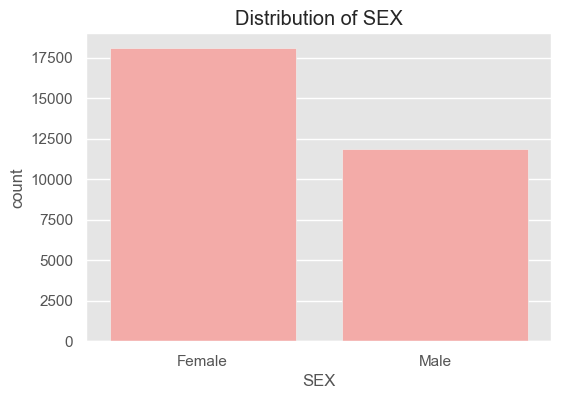

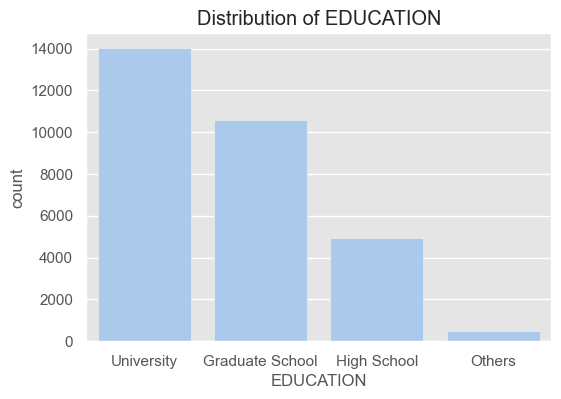

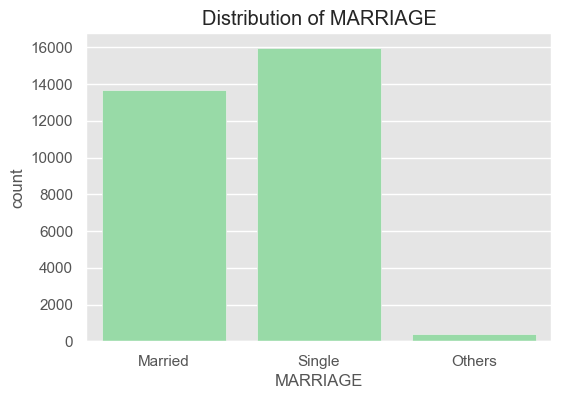

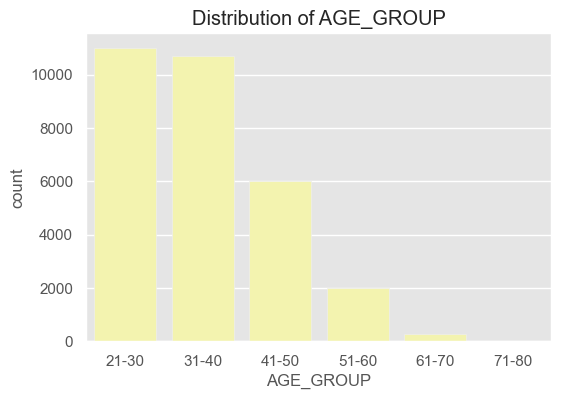

In [169]:
# check sparsity in categorical columns
colors = ['r', 'b', 'g', 'y', 'm', 'c']
for col, c in zip(category_cols, colors):
    plt.style.use('ggplot')
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x=col, color=c)
    plt.title(f'Distribution of {col}')
    plt.show()

In [170]:
# checking about sparse values in numeric columns, checking percentage of zeros
sparse_info = {}    
for col in numeric_cols:
    sparse_info[col] = (df[col] == 0).sum() / df.shape[0] * 100  # percentage of zeros   
sparse_info = dict(sorted(sparse_info.items(), key=lambda item: item[1], reverse=True))
sparse_info 
pd.DataFrame(sparse_info, index=['sparsity %']).T   

,sparsity %
PAY_5,90.106667
PAY_6,89.736667
PAY_4,88.300000
PAY_3,85.956667
PAY_2,85.206667
PAY_1,77.273333
PAY_AMT6,23.910000
PAY_AMT5,22.343333
PAY_AMT4,21.360000
PAY_AMT3,19.893333


In [171]:
df['SEX'].value_counts()

SEX
Female    18112
Male      11888
Name: count, dtype: int64

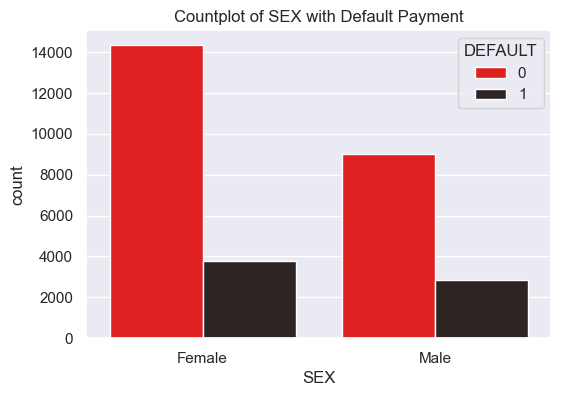

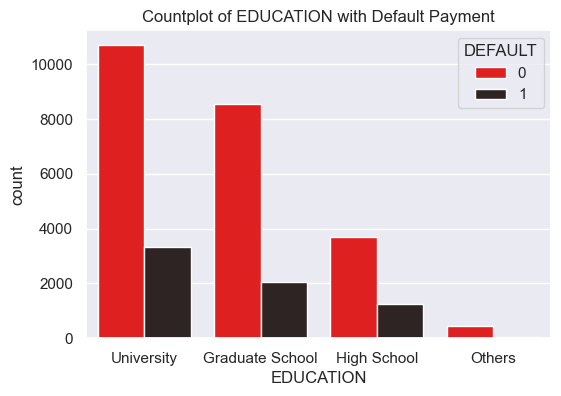

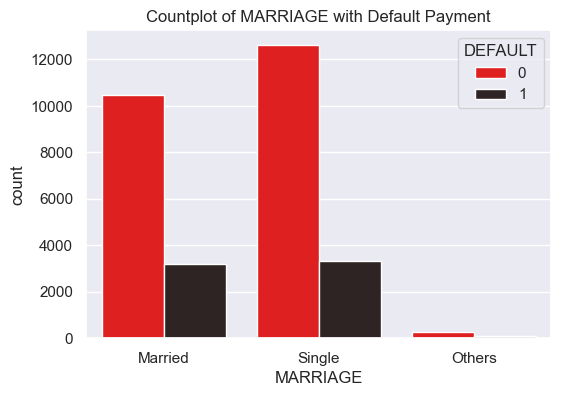

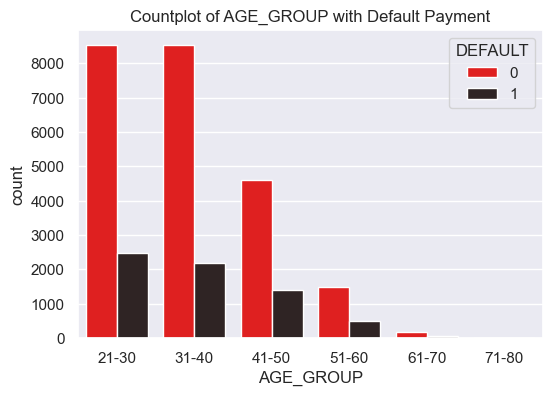

In [172]:
# check relationship between categorical columns and target variable
for col, c in zip(category_cols, colors):
    sns.set_theme(style="darkgrid")
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x=col, hue=target,  palette='dark:red_r')
    plt.title(f'Countplot of {col} with Default Payment')
    plt.show()

In [173]:
# function to draw histograms for numeric columns
def draw_histograms(dataframe, cols, n_rows, n_cols, figsize=(15, 10)):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, col in enumerate(cols):
        if i < len(axes):
            sns.histplot(data=dataframe, x=col, kde=True, ax=axes[i], color=random.choice(colors))
            axes[i].set_title(f'Histogram of {col}')
    
    plt.tight_layout()
    plt.show()

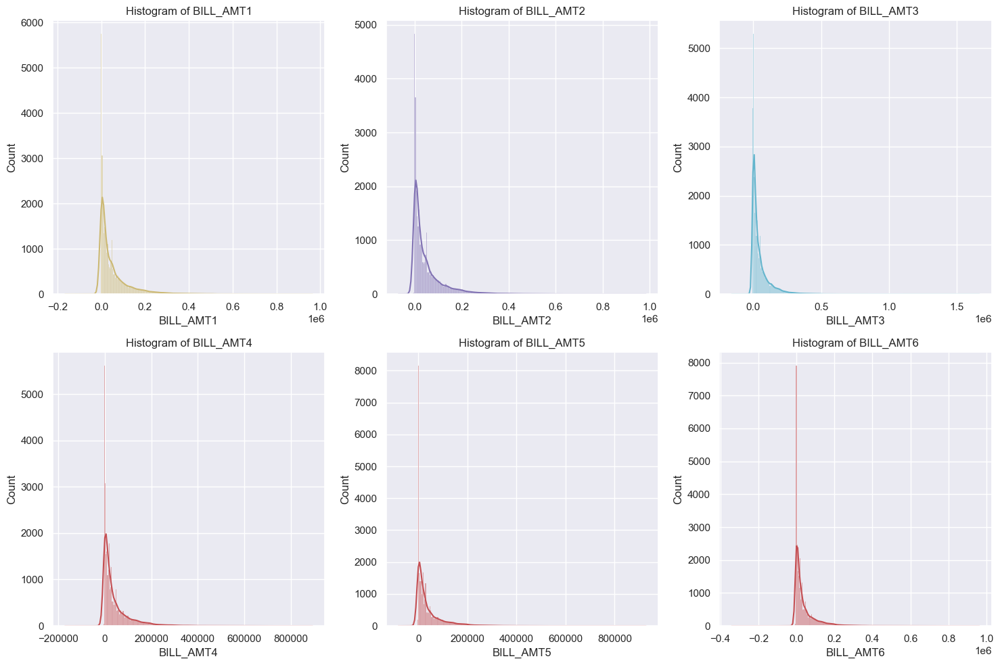

In [174]:
bills = [col for col in numeric_cols if 'BILL_AMT' in col]
draw_histograms(df, bills, 2, 3, figsize=(15, 10))

In [175]:
df[bills].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6
count,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000
mean,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400
std,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537
min,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000
25%,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000
50%,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000
75%,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000
90%,142133.700000,136905.500000,1.320513e+05,122418.700000,115883.000000,112110.400000
95%,201203.050000,194792.200000,1.878210e+05,174333.350000,165794.300000,161912.000000
99%,350110.680000,337495.280000,3.250304e+05,304997.270000,285868.330000,279505.060000


In [176]:
# Filter rows where all 'bills' columns are less than their respective 99th percentile
bills_99 = {col: df[col].quantile(0.99) for col in bills}
rows_under_99 = df[(df[bills] < pd.Series(bills_99)).all(axis=1)]
rows_under_99.shape

(29468, 25)

**What bill amount says and What we can do with this**

from above histogram, we can clearly see it is `right-skewed distribution`, most customers (~ 75%) have relatively low bill amounts (<65000), few customers have very high bills. and also high bills mean potentially higher risk. further, high bills are indication of emergency spending or potential fraud. Since we can see spending range, we can group customers, and also we can calculate their spending strength as per credit limit. (`Bill to Credit Limit Ratio`)

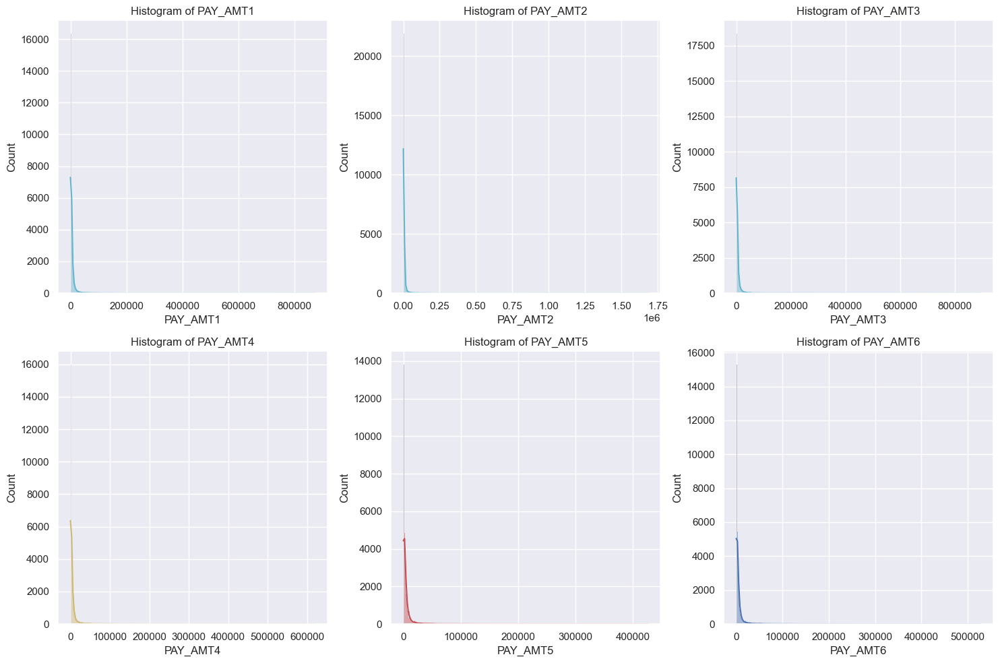

In [177]:
paid_amounts_cols = [col for col in numeric_cols if 'PAY_AMT' in col]
draw_histograms(df, paid_amounts_cols, 2, 3, figsize=(15, 10))

In [178]:
df[paid_amounts_cols].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
90%,10300.000000,1.040110e+04,10000.00000,9570.600000,9500.000000,9600.000000
95%,18428.200000,1.900435e+04,17589.40000,16014.950000,16000.000000,17343.800000
99%,66522.180000,7.665102e+04,70000.00000,67054.440000,65607.560000,82619.050000


In [179]:
# function to draw boxplots for numeric columns
def draw_boxplots(dataframe, cols, n_rows, n_cols, figsize=(15, 10)):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, col in enumerate(cols):
        if i < len(axes):
            sns.boxplot(data=dataframe, x=col, ax=axes[i], color=random.choice(colors))
            axes[i].set_title(f'Boxplot of {col}')
    
    plt.tight_layout()
    plt.show()


**Removing rows which is more than percentile 95 to see better payment range in plots**

In [180]:
# Filter rows where all 'previous' columns are less than their respective 95th percentile
paid_amounts_95 = {col: df[col].quantile(0.95) for col in paid_amounts_cols}
paid_amounts_95 = df[(df[paid_amounts_cols] < pd.Series(paid_amounts_95)).all(axis=1)]
paid_amounts_95.shape


(24271, 25)

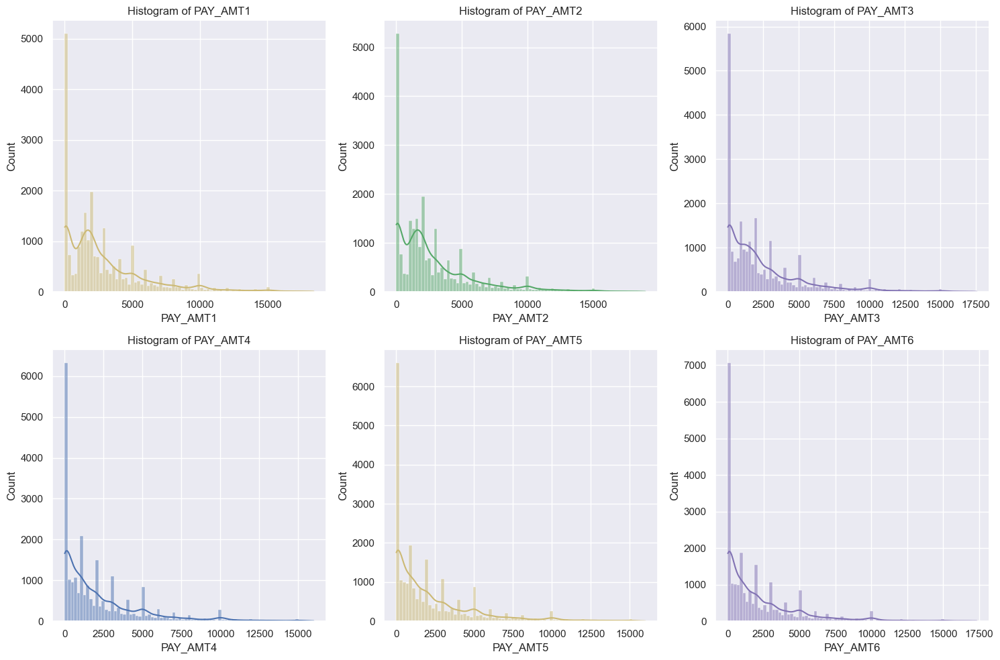

In [181]:
 
draw_histograms(paid_amounts_95, paid_amounts_cols, 2, 3, figsize=(15,10))

From above histograms, highly skewed distribution is observed in all the previous payment amount columns after even removing the extreme outliers.

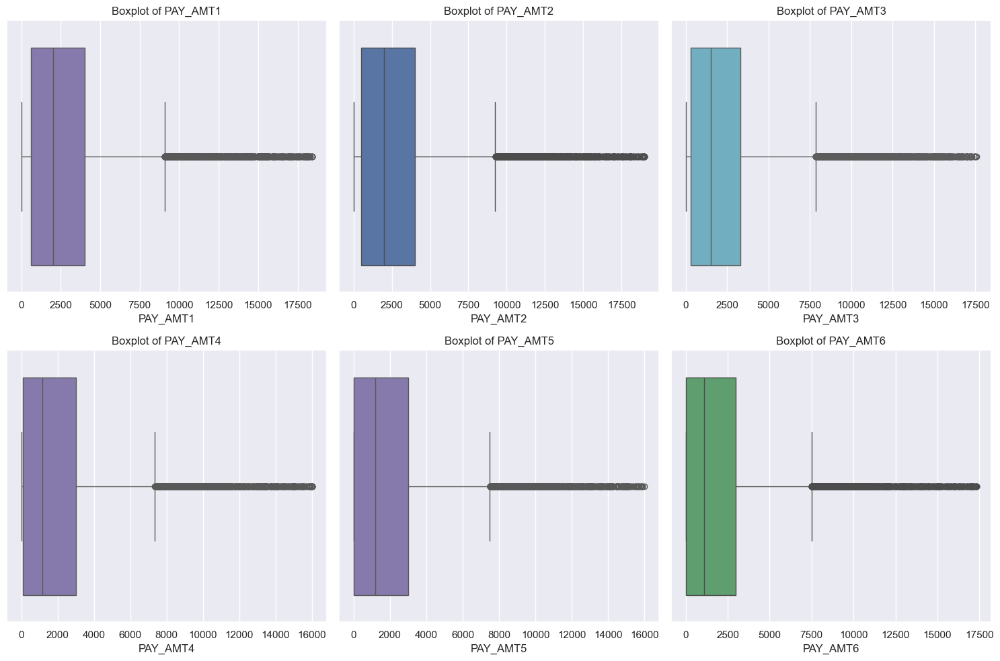

In [182]:
draw_boxplots(paid_amounts_95, paid_amounts_cols, 2, 3, figsize=(15, 10))

In [183]:
# from above boxplots we can see that there are still some outliers in the data but they are not that significant. So we can keep them as it is.    

**What paid amount says and What we can do with this**

Most customers make relatively small payments, paying only a small fraction of their bills. We need to see payment to bill ratio as well

In [184]:
df[df[paid_amounts_cols].sum(axis=1) == 0].head()  # customers who never paid anything in last 6 months

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,AGE_GROUP
18,360000.0,Female,Graduate School,Married,49,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,41-50
19,180000.0,Female,Graduate School,Single,29,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,21-30
45,210000.0,Male,Graduate School,Single,29,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,21-30
79,240000.0,Female,University,Single,44,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,41-50
109,360000.0,Male,University,Married,35,1,0,0,0,0,0,-103.0,-103.0,-103.0,-103.0,-103.0,-103.0,0.0,0.0,0.0,0.0,0.0,0.0,0,31-40


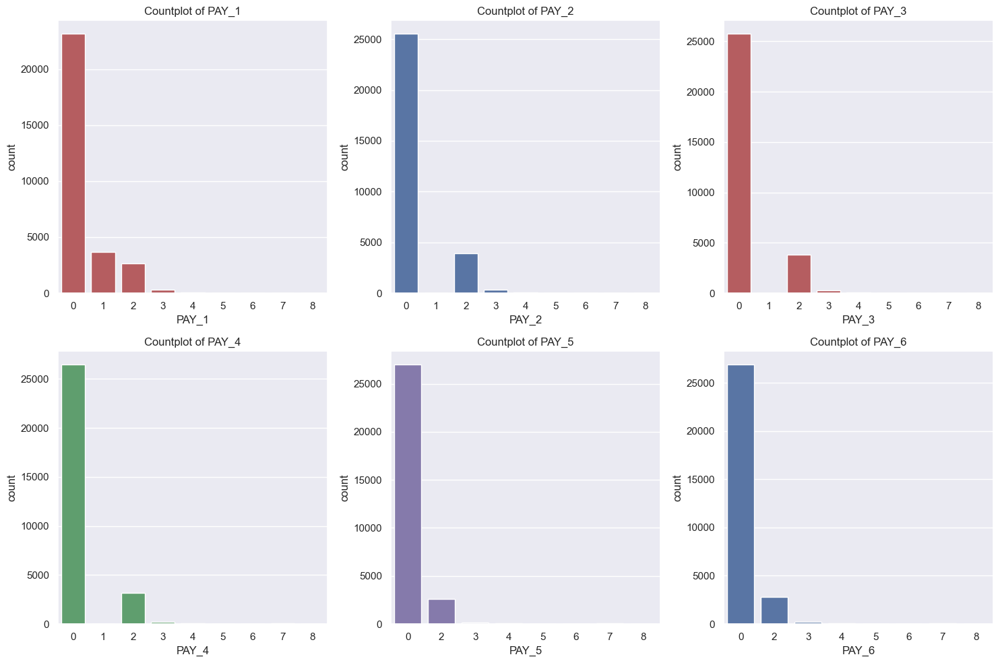

In [185]:
# Fnction to draw barplots for categorical columns
def draw_barplots(dataframe, cols, n_rows, n_cols, figsize=(15, 10)):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, col in enumerate(cols):
        if i < len(axes):
            sns.countplot(data=dataframe, x=col, ax=axes[i], color=random.choice(colors))
            axes[i].set_title(f'Countplot of {col}')
    
    plt.tight_layout()
    plt.show()

draw_barplots(df, [f'PAY_{i+1}' for i in range(6)], 2, 3, figsize=(15, 10))

In [186]:
# it is observed that majority of the customers have paid duly in last 6 months. Very few customers have delayed payments and 
# it is also with delay of 2 or 3 months.


In [187]:
df['LIMIT_BAL'].describe()

count      30000.000000
mean      167484.322667
std       129747.661567
min        10000.000000
25%        50000.000000
50%       140000.000000
75%       240000.000000
max      1000000.000000
Name: LIMIT_BAL, dtype: float64

In [188]:
mode_of_credit_limit = df['LIMIT_BAL'].mode()
print(f"Mode of CREDIT LIMIT: {mode_of_credit_limit[0]}")

Mode of CREDIT LIMIT: 50000.0


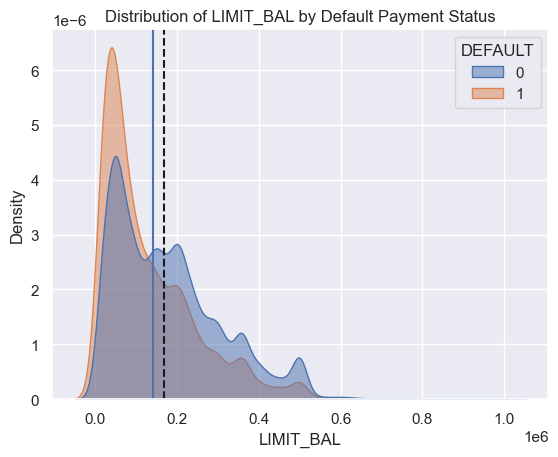

In [189]:
sns.kdeplot(data=df, x='LIMIT_BAL', hue=target, fill=True, common_norm=False, alpha=0.5)
plt.axvline(x=df['LIMIT_BAL'].mean(), color='k', linestyle='--', label='Mean LIMIT_BAL')
plt.axvline(x=df['LIMIT_BAL'].median(), color='b', linestyle='-', label='Median LIMIT_BAL')
plt.title('Distribution of LIMIT_BAL by Default Payment Status')
plt.show()


In [190]:
# As per above distribution, we can see that most customers have a credit limit of less than 100,000. 
# The mean credit limit is around 167,484, which is higher than the median of 140,000, 
# indicating a right-skewed distribution. This suggests that while most customers have lower credit limits, 
# there are some with significantly higher limits that raise the average. but here one notably, 
# most defaulted customers are having a credit limit less than or equal to 140000.

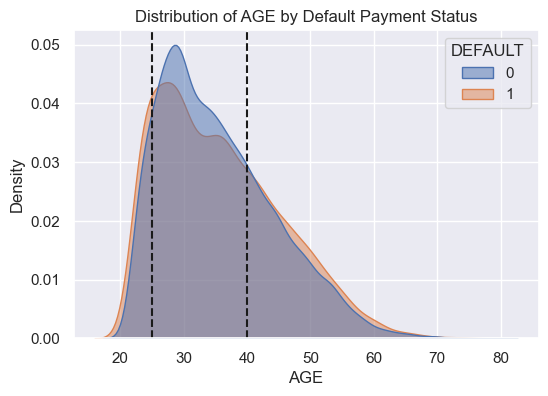

In [191]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(6,4))   
sns.kdeplot(data=df, x='AGE', hue=target, fill=True, common_norm=False, alpha=0.5)
plt.axvline(x=25, color='k', linestyle='--', label='Mean AGE')
plt.axvline(x=40, color='k', linestyle='--', label='Median AGE')
plt.title('Distribution of AGE by Default Payment Status')
plt.show()

In [192]:
# as per above age distribution, most customers are between 20-50 years old. 
# and defaulted customers are mostly less than 25 or more than 40 years old.
# so age is not a significant factor for default payment prediction

In [194]:
# Check if there are subtle differences
default_rates_by_age = df.groupby('AGE_GROUP', observed=False)[target].mean()
print(default_rates_by_age)

AGE_GROUP
21-30    0.224371
31-40    0.204331
41-50    0.232973
51-60    0.252379
61-70    0.264591
71-80    0.333333
Name: DEFAULT, dtype: float64


In [ ]:
# above output shows that default rates are relatively consistent across different age groups

In [195]:
df_cross_tab = pd.crosstab(df['EDUCATION'], df[target], rownames=['EDUCATION'], colnames=['Defaulted'])
df_cross_tab["default_rate (%)"] = (df_cross_tab[1] / (df_cross_tab[0] + df_cross_tab[1]) * 100).round(2)
df_cross_tab

Defaulted,0,1,default_rate (%)
EDUCATION,,,
Graduate School,8549,2036,19.23
High School,3680,1237,25.16
Others,435,33,7.05
University,10700,3330,23.73


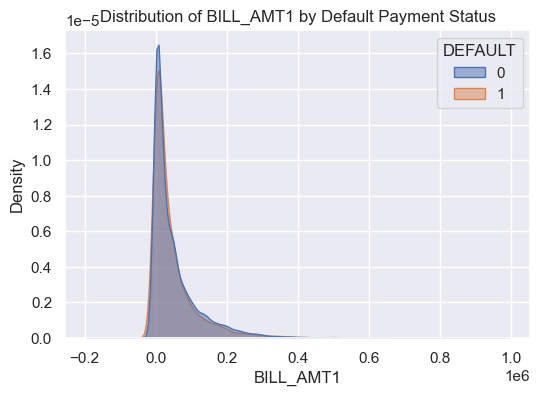

In [196]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(6,4))   
sns.kdeplot(data=df, x='BILL_AMT1', hue=target, fill=True, common_norm=False, alpha=0.5)
plt.title('Distribution of BILL_AMT1 by Default Payment Status')
plt.show()

In [197]:
pd.set_option('future.no_silent_downcasting', True)

**Key Observation Alert**

In [198]:
df_september = df[['BILL_AMT1', 'PAY_AMT1', 'PAY_1','PAY_2', 'PAY_3', 'PAY_4',  target]]
df_september['paid_enough_september'] = df_september['PAY_AMT1'] >= df_september['BILL_AMT1']
df_september[['paid_enough_september', 'PAY_AMT1', 'BILL_AMT1', 'PAY_1']].tail()
df_september['paid_enough_september'].value_counts()

C:\Users\SathkunarajahM\AppData\Local\Temp\ipykernel_15908\223111499.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_september['paid_enough_september'] = df_september['PAY_AMT1'] >= df_september['BILL_AMT1']


paid_enough_september
False    23531
True      6469
Name: count, dtype: int64

In [199]:
df_september[(df_september['paid_enough_september'] == True) & (df_september[target] == 1) ]

,BILL_AMT1,PAY_AMT1,PAY_1,PAY_2,PAY_3,PAY_4,DEFAULT,paid_enough_september
21,316.0,316.0,0,0,0,0,1,True
23,5512.0,19428.0,0,0,0,0,1,True
26,-109.0,0.0,1,0,0,0,1,True
38,0.0,780.0,1,0,0,0,1,True
45,0.0,0.0,0,0,0,0,1,True
...,...,...,...,...,...,...,...,...
29911,326.0,326.0,0,0,0,0,1,True
29929,1804.0,1804.0,0,0,0,0,1,True
29942,1475.0,1826.0,0,0,0,0,1,True
29973,0.0,0.0,1,0,0,0,1,True


In [200]:
# it is noteworthy that a significant number of customers who paid their September bill in full still defaulted on their next payment.
# not only that, their last payment status for last four months was also 0, indicating that they had paid duly in those months as well.
# it suggests that factors other than just the most recent payment behavior are influencing default risk.
# it could be related to their overall financial situation, credit history, or other external factors not captured in this dataset.

#### Bivariate Analysis

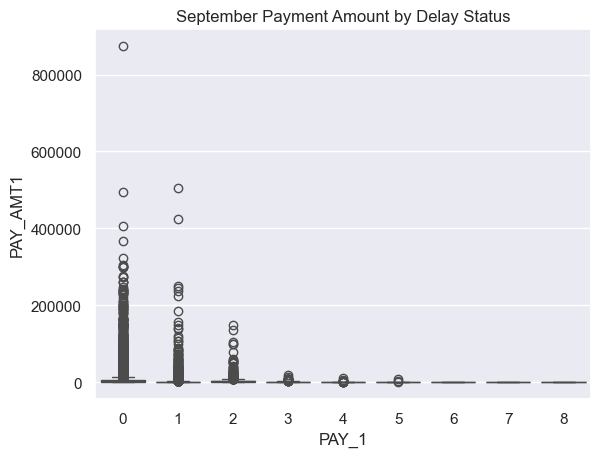

In [201]:
sns.boxplot(x='PAY_1', y='PAY_AMT1', data=df)
plt.title('September Payment Amount by Delay Status')
plt.show()

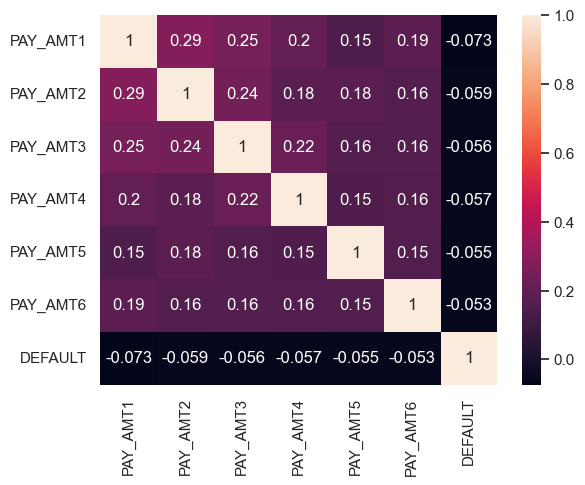

In [202]:
sns.heatmap(df[payment_amount_cols + [target]].corr(), annot=True) # check correlation between payment amount columns and target variable
plt.show()

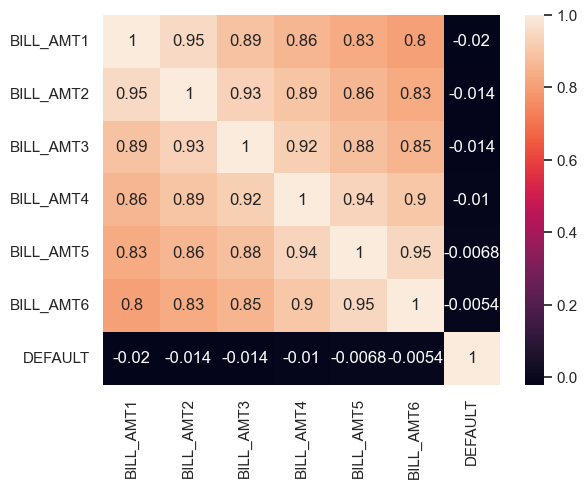

In [203]:
sns.heatmap(df[bill_amount_cols + [target]].corr(), annot=True) # check correlation between bill amount columns and target variable
plt.show()

In [204]:
# obeservation: bill amounts are more correlated with other bill amounts. so here multicollinearity might be an issue.
#  so we may drop some bill month columns. 

In [205]:
numeric_cols = df.select_dtypes(include=["number"]).columns.tolist()
plt.figure(figsize=(16, 10), dpi=1200)
sns.heatmap(
    df[numeric_cols].corr(),
    annot=True,
    square=True,
    linewidths=0.5,
    cmap="Blues",
    fmt=".2f",
    cbar_kws={"shrink": 0.5},
    annot_kws={"size": 8},
) # check correlation between all numeric columns
plt.show()

In [206]:
# -- key findings from heatmap:--
# here, what we can observe is that bill amount columns are highly correlated with each other.
#  and payment amount columns are also correlated with each other.
# so we need to drop some of these columns to avoid multicollinearity issue.
# why because some algorithms like logistic regression are sensitive to multicollinearity? 
# because they assume that the features are independent of each other.
# Since it is a classification problem, feature to feature correlation should be considered.
# and only payment status columns are correlated with the target variable.

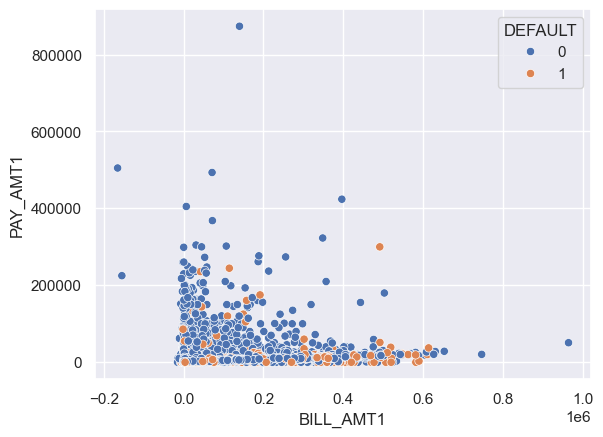

In [207]:
sns.scatterplot(x='BILL_AMT1', y='PAY_AMT1', hue=target, data=df)
plt.show()

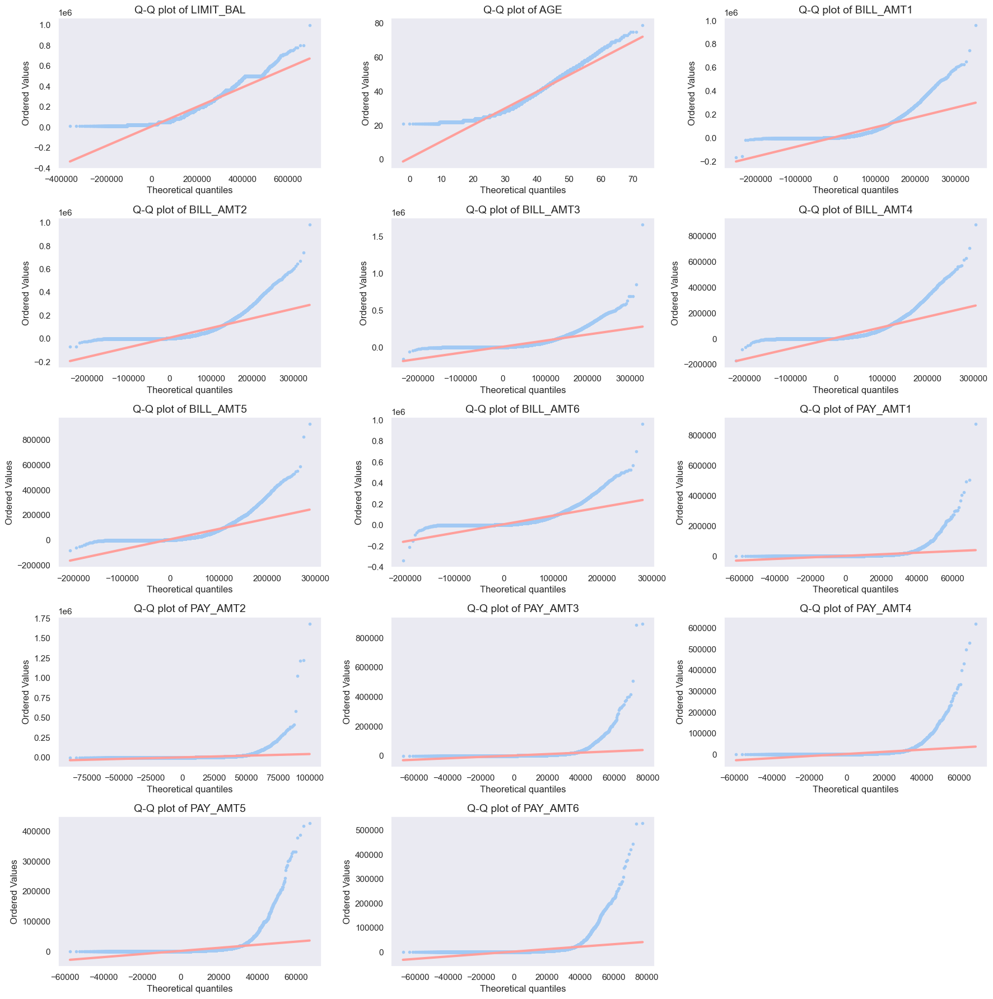

In [208]:
import scipy.stats as stats
# Check gaussian distribution
sns.set_color_codes('pastel')
fig, axs = plt.subplots(5, 3, figsize=(18,18))

numeric = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']
i, j = 0, 0
for f in numeric:
    if j == 3:
        j = 0
        i = i+1
    stats.probplot(df[f], 
                   dist='norm', 
                   sparams=(df[f].mean(), df[f].std()), 
                   plot=axs[i,j])
    axs[i,j].set_title(f'Q-Q plot of {f}', fontsize=14)
    axs[i,j].get_lines()[0].set_marker('.')
    
    axs[i,j].grid()
    axs[i,j].get_lines()[1].set_linewidth(3.0)
    j = j+1

fig.tight_layout()
axs[4,2].set_visible(False)
# plt.savefig('images/QQplot.png')
plt.show()


In [209]:
# we have already checked the skewness of numeric columns in the previous cells. to avoid skewness,
# we can apply standard scaling or min-max scaling.

**Learning Point**

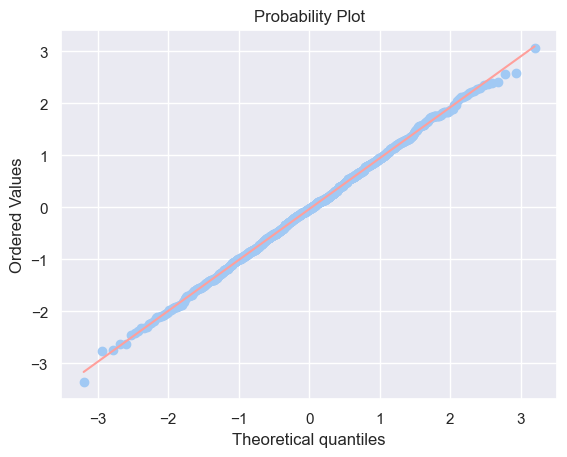

In [210]:
# how ideally QQ plot should look like for normal distribution
import scipy.stats as stats
import matplotlib.pyplot as plt
data = np.random.normal(0, 1, 1000)
stats.probplot(data, dist="norm", plot=plt)
plt.show()


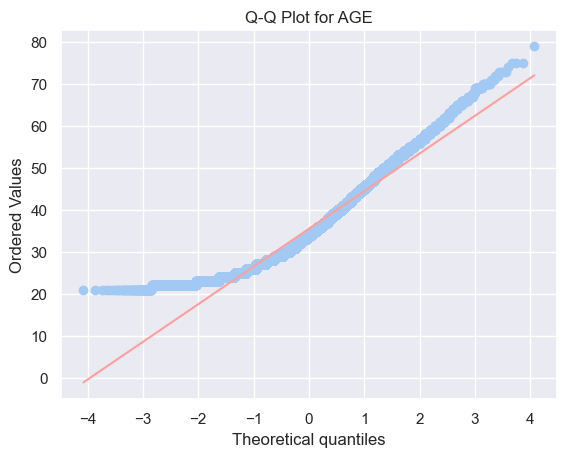

In [211]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Example for AGE
stats.probplot(df['AGE'], dist="norm", plot=plt)
plt.title('Q-Q Plot for AGE')
plt.show()

In [212]:
# Save the cleaned dataframe to a new CSV file
cleaned_filename = pathlib.Path(os.path.dirname(os.getcwd())) / pathlib.Path('data/processed/credit_card_cleaned.csv')
df.to_csv(cleaned_filename, index=False)

## **3. Data Preprocessing,  Feature Engineering & Feature Selection**

#### **3.0 Dataset Creation**


To ensure robust model performance and fair evaluation, I created six distinct datasets by systematically varying preprocessing steps. The process includes:

- **Scaling**: All datasets are standardized using `StandardScaler` to normalize feature ranges.
- **Balancing**: SMOTE is applied to selected datasets to address class imbalance.
- **Dimensionality Reduction**: PCA is used in some datasets to reduce feature space while retaining variance.
- **Feature Engineering**: Custom features are derived from raw data to enhance model learning.


- `step1`: `FE` (Feature Engineered) or `Raw`
- `step2`: `Scaled and Normalized (Categorical features)`
- `step3`: `Balanced`, `Unbalanced`, `PCA`, or combinations

| Dataset | Description | `X_train` Name | `y_test` Name |
|--------|-------------|----------------|---------------|
| 1 | Scaled + Unbalanced (no PCA) | `X_train_Raw_Scaled_Unbalanced` | `y_test_Raw_Scaled_Unbalanced` |
| 2 | Scaled + Unbalanced + PCA | `X_train_Raw_Scaled_Unbalanced_PCA` | `y_test_Raw_Scaled_Unbalanced_PCA` |
| 3 | Scaled + Balanced (no PCA) | `X_train_Raw_Scaled_Balanced` | `y_test_Raw_Scaled_Balanced` |
| 4 | Scaled + Balanced + PCA | `X_train_Raw_Scaled_Balanced_PCA` | `y_test_Raw_Scaled_Balanced_PCA` |
| 5 | Feature Engineered + Scaled + Balanced | `X_train_FE_Scaled_Balanced` | `y_test_FE_Scaled_Balanced` |
| 6 | Feature Engineered + Scaled + Unbalanced | `X_train_FE_Scaled_Unbalanced` | `y_test_FE_Scaled_Unbalanced` |

Each dataset is split into `X_train` and `y_test` using stratified sampling to preserve class distribution. This setup allows for comparative analysis of how preprocessing impacts model accuracy, generalization, and fairness.


In [22]:
df = pd.read_csv(r'..\data\processed\credit_card_cleaned.csv')
df.head(2)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,AGE_GROUP
0,20000.0,Female,University,Married,24,2,2,0,0,0,0,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1,21-30
1,120000.0,Female,University,Single,26,0,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1,21-30


In [23]:
# DEFINE SOME COMMON VARIABLES
repayment_status_cols = [f'PAY_{i+1}' for i in range(6)]
bill_amount_cols = [f'BILL_AMT{i+1}' for i in range(6)]
payment_amount_cols = [f'PAY_AMT{i+1}' for i in range(6)]

# Set target variable
target = 'DEFAULT'

# Define categorical and numeric columns for further analysis
category_cols = ['SEX', 'EDUCATION', 'MARRIAGE', 'AGE_GROUP']
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in category_cols + ['DEFAULT', 'AGE']]

#### **3.1 Dataset with only encoding and scaling**

##### **Dataset 1: Scaled + Unbalanced (Baseline Dataset)**

In [24]:
# SCALED AND NORMALIZATION #
# one hot encoding for categorical columns


# ONE HOT ENCODING FOR CATEGORICAL FEATURES #
age_dummies = pd.get_dummies(df['AGE_GROUP'], prefix='AGE', dtype=int)
df_one_hot = pd.concat([df, age_dummies], axis=1)
df_one_hot.drop(columns=['AGE_GROUP', 'AGE'], inplace=True)
df_one_hot = pd.get_dummies(df_one_hot, columns=['SEX', 'EDUCATION', 'MARRIAGE'], dtype=int)
df_encoded = df_one_hot.copy()

In [25]:
# TRAINING AND TESTING DATA SPLIT
X = df_encoded.drop(columns=['DEFAULT'])
y = df_encoded['DEFAULT']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
encoded_cols = [col for col in X.columns if col not in numeric_cols]


In [26]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[numeric_cols])
X_test_scaled = scaler.transform(X_test[numeric_cols])

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numeric_cols, index=X_train.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numeric_cols, index=X_test.index)

X_train_scaled_unbalanced = pd.concat([X_train[encoded_cols], X_train_scaled_df], axis=1)
X_test_scaled_unbalanced = pd.concat([X_test[encoded_cols], X_test_scaled_df], axis=1)
print("Train and Test shapes after scaling:")
print(X_train_scaled_unbalanced.shape, X_test_scaled_unbalanced.shape)


Train and Test shapes after scaling:
(24000, 34) (6000, 34)


##### **Dataset 2: Scaled + Unbalanced + PCA**

In [27]:
pca = PCA(n_components=0.95)
X_train_scaled_unbalanced_pca = pca.fit_transform(X_train_scaled_unbalanced)
X_test_scaled_unbalanced_pca = pca.transform(X_test_scaled_unbalanced)

print(f"Scaled + Unbalanced + PCA")
print(X_train_scaled_unbalanced_pca.shape, X_test_scaled_unbalanced_pca.shape)

Scaled + Unbalanced + PCA
(24000, 18) (6000, 18)


##### **Dataset 3: Scaled + Balanced**

In [28]:
smote = SMOTE(random_state=42)
X_train_scaled_balanced, y_train_scaled_balanced = smote.fit_resample(X_train_scaled_unbalanced, y_train)
X_test_scaled_balanced = X_test_scaled_unbalanced.copy()
print(f"Scaled + Balanced")
print(X_train_scaled_balanced.shape, X_test_scaled_balanced.shape, y_train_scaled_balanced.shape)


Scaled + Balanced
(37354, 34) (6000, 34) (37354,)


##### **Dataset 4: Scaled + Balanced + PCA**

In [29]:
pca = PCA(n_components=.9)
X_train_scaled_balanced_pca = pca.fit_transform(X_train_scaled_balanced)
X_test_scaled_balanced_pca = pca.transform(X_test_scaled_balanced)
y_train_scaled_balanced_pca = y_train_scaled_balanced.copy()
print(f"Scaled + Unbalanced + PCA")
print(X_train_scaled_balanced_pca.shape, X_test_scaled_balanced_pca.shape, y_train_scaled_balanced_pca.shape)

Scaled + Unbalanced + PCA
(37354, 14) (6000, 14) (37354,)


#### **3.2 Dataset with feature engineering**

In [249]:
featured_df = pd.read_csv(r'..\data\processed\credit_card_cleaned.csv')
# df.rename(columns=str.lower, inplace=True)
#  PAY_X is a timing indicator, not a completeness indicator
featured_df.head(2)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,AGE_GROUP
0,20000.0,Female,University,Married,24,2,2,0,0,0,0,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1,21-30
1,120000.0,Female,University,Single,26,0,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1,21-30


In [ ]:
featured_df['delay_score'] = featured_df[['PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']].sum(axis=1)
featured_df['min_pay_ratio_sep'] = featured_df['PAY_AMT1'] / (featured_df['BILL_AMT1'] + 1)
featured_df['payment_std'] = featured_df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].std(axis=1)

# - 18-25: Young adults, limited credit history
# - 26-35: Early career, establishing credit
# - 36-50: Established career, stable income
# - 51-65: Peak earning years
# - 65+: Retirement age, fixed income

featured_df["AGE_GROUP"] = pd.cut(
    featured_df["AGE"],
    bins=[18, 25, 35, 50, 65, 100],
    labels=["18-25", "26-35", "36-50", "51-65", "65+"],
)

mapping = dict(
    zip(
        ["18-25", "26-35", "36-50", "51-65", "65+"],
        [
            "Young adults",
            "Early career",
            "Established career",
            "Peak earning years",
            "Retirement age",
        ],
    )
)

featured_df["AGE_GROUP"] = featured_df["AGE_GROUP"].map(mapping)


age_order = {
    'Young adults': 0,
    'Early career': 1,
    'Established career': 2,
    'Peak earning years': 3,
    'Retirement age': 4
}

# Apply encoding
featured_df['age_encoded'] = featured_df['AGE_GROUP'].map(age_order)

#Credit card utilization and balance ratios
featured_df['util_ratio_avg'] = featured_df[bill_amount_cols].mean(axis=1)/featured_df['LIMIT_BAL']

featured_df['payment_ratio_avg'] = featured_df[payment_amount_cols].mean(axis=1) / (featured_df[bill_amount_cols].mean(axis=1) + 1)
featured_df['severe_late_count'] = (featured_df[repayment_status_cols] > 2).sum(axis=1)

education_order = {
    'Others': 0,
    'High School': 1,
    'Graduate School': 2,
    'University': 3
}
featured_df['education_encoded'] = featured_df['EDUCATION'].map(education_order)

scaler = MinMaxScaler()
featured_df['limit_balance_scaled'] = scaler.fit_transform(featured_df[['LIMIT_BAL']])

featured_df[['mar_encoded1', 'mat_encoded2']] = pd.get_dummies(featured_df['MARRIAGE'], drop_first=True, dtype=int, prefix='mar')
featured_df['sex_encoded'] = pd.get_dummies(featured_df['SEX'], drop_first=True, dtype=int)
featured_df.replace([np.inf, -np.inf], np.nan, inplace=True)
featured_df.dropna(inplace=True)


##### **Dataset 5: Feature Engineered + Scaled + Unbalanced**

In [251]:
fe_required_cols = ['delay_score', 'min_pay_ratio_sep', 'payment_std', 'util_ratio_avg',
       'payment_ratio_avg', 'severe_late_count', 'education_encoded',
       'limit_balance_scaled', 'mar_encoded1', 'mat_encoded2', 'sex_encoded',
       'age_encoded']

X = featured_df.copy()[fe_required_cols]
y = featured_df['DEFAULT']

X_train_fe, X_test_fe, y_train_fe, y_test_fe = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train_fe, y_train_fe)

y_pred = model.predict(X_test_fe)

print(classification_report(y_test_fe, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.96      0.88      4673
           1       0.61      0.24      0.34      1324

    accuracy                           0.80      5997
   macro avg       0.71      0.60      0.61      5997
weighted avg       0.77      0.80      0.76      5997



##### **Dataset 6: Feature Engineered + Scaled + Balanced**

**Feature Engineered Columns Have No Significant Impact**

This suggests that the new columns created through feature engineering (e.g., ratios, transformations, aggregations) aren't improving model performance.

Possible reasons:
- The engineered features may be redundant or highly correlated with existing ones.
- They might not capture meaningful patterns or relationships.

so we opted not to apply any balancing techniques at this stage."


#### **3.3 Random Model checking**

In [30]:
#train a logistic regression model for SCALED + BALANCED
logistic_model = LogisticRegression(random_state=42, max_iter=1000)
logistic_model.fit(X_train_scaled_balanced, y_train_scaled_balanced)

y_pred = logistic_model.predict(X_test_scaled_balanced)
y_pred_prob = logistic_model.predict_proba(X_test_scaled_balanced)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

Accuracy: 0.7938
F1 Score: 0.5207
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.87      0.87      4687
           1       0.53      0.51      0.52      1313

    accuracy                           0.79      6000
   macro avg       0.70      0.69      0.69      6000
weighted avg       0.79      0.79      0.79      6000



Best parameters: {'logistic__C': 1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.6485
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      4687
           1       0.50      0.56      0.53      1313

    accuracy                           0.78      6000
   macro avg       0.68      0.70      0.69      6000
weighted avg       0.79      0.78      0.78      6000



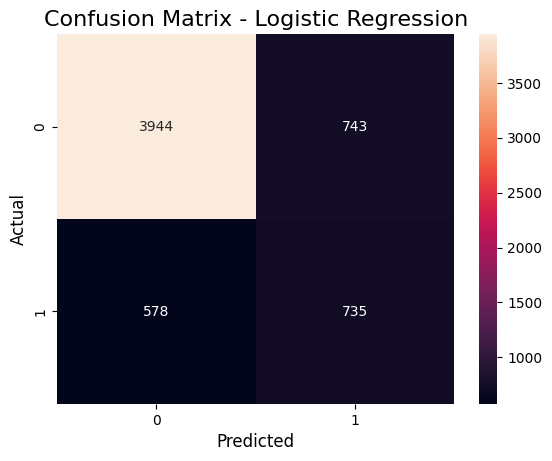

In [31]:
#train a logistic regression model for SCALED + BALANCED with hypertuning
pipe = Pipeline([
    # ('scaler', StandardScaler()), 
    ('pca', PCA(n_components=10)),  
    ('logistic', LogisticRegression(random_state=42, max_iter=1000, C=0.01))
])

param_grid = {
    'logistic__C': [0.001, 0.01, 0.1, 1, 10],
    'logistic__penalty': ['l1', 'l2'],  
    'logistic__solver': ['liblinear']  # 'liblinear' supports both 'l1' and 'l2' penalties
}

grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train_scaled_balanced, y_train_scaled_balanced)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation F1 score: {grid_search.best_score_:.4f}")
print(classification_report(y_test, grid_search.predict(X_test_scaled_balanced)))

sns.heatmap(confusion_matrix(y_test, grid_search.predict(X_test_scaled_balanced)), annot=True, fmt='d')
plt.title('Confusion Matrix - Logistic Regression', fontsize=16)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

**🔴OUTPERFORMED**

              precision    recall  f1-score   support

           0       0.87      0.82      0.84      4687
           1       0.47      0.57      0.51      1313

    accuracy                           0.76      6000
   macro avg       0.67      0.69      0.68      6000
weighted avg       0.78      0.76      0.77      6000

ROC AUC Score: 0.7704


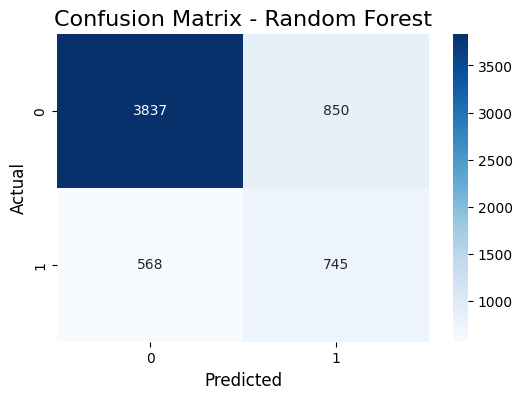

In [32]:
# EXCEPTIONAL PERFORMANCE ON DEFAULT - RECALL 98%
rf = RandomForestClassifier(
    # class_weight={0: 1, 1: 5},
    class_weight= 'balanced',
    n_estimators=200,        # More trees
    max_depth=10,            # Prevent overfitting
    min_samples_split=10,    # Require more samples to split
    min_samples_leaf=5,      # Require more samples in leaves
    random_state=42
)

rf.fit(X_train_scaled_balanced, y_train_scaled_balanced)
y_pred = rf.predict(X_test_scaled_balanced)
print(classification_report(y_test, y_pred))
y_pred_prob = rf.predict_proba(X_test_scaled_balanced)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"ROC AUC Score: {roc_auc:.4f}")

plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Random Forest', fontsize=16)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

In [33]:
svm = SVC(C=10, gamma=0.01, kernel='rbf')

svm.fit(X_train_scaled_balanced, y_train_scaled_balanced)

y_pred = svm.predict(X_test_scaled_balanced)
# y_pred_prob = svm.predict_proba(X_test_final)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

Accuracy: 0.7877
F1 Score: 0.5189
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      4687
           1       0.51      0.52      0.52      1313

    accuracy                           0.79      6000
   macro avg       0.69      0.69      0.69      6000
weighted avg       0.79      0.79      0.79      6000



In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
rand_grid = RandomizedSearchCV(
    estimator=SVC(),
    param_distributions={
        "C": [0.1, 1, 10, 100],
        "gamma": [0.001, 0.01, 0.1],
        "kernel": ["rbf", "linear"],
    },
    cv=cv,
    n_iter=5000,
    scoring="accuracy",
    random_state=42,
)

rand_grid.fit(X_train_scaled_balanced, y_train_scaled_balanced)
print(rand_grid.best_params_)

## **4. Model Selection & Training**

#### **4.0 Setup**

##### **4.0.1 Various Datasets**

In [31]:
datasets = {
    'Scaled + Unbalanced': [X_train_scaled_unbalanced, X_test_scaled_unbalanced, y_train, y_test],
    'Scaled + Unbalanced + PCA': [X_train_scaled_unbalanced_pca, X_test_scaled_unbalanced_pca, y_train, y_test],
    'Scaled + Balanced': [X_train_scaled_balanced, X_test_scaled_balanced ,y_train_scaled_balanced, y_test],
    'Scaled + Balanced + PCA': [X_train_scaled_balanced_pca, X_test_scaled_balanced_pca,y_train_scaled_balanced_pca, y_test]
}

##### **4.0.2 Utility Functions**

In [32]:
def model_eval_report(datasets, parameters, param_grid, pipe):
    scores = defaultdict(list)
    confusion_matrix_list = []
    roc_auc_scores = []
    for dataset_name, dataset_X_y in datasets.items():
        model_name = type(list(pipe.named_steps.values())[0]).__name__
        start_time = time.time()
        print(dataset_name)
        X_train, X_test, y_train, y_test = dataset_X_y

        grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='f1', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        y_pred = grid_search.predict(X_test)
        y_scores = grid_search.predict_proba((X_test))[:, 1]
        end_time = time.time()
        best_parameters = list(zip(parameters, [p for p in grid_search.best_params_.values()]))
        print(f"Best parameters: {grid_search.best_params_}")
        print(f"Best cross-validation F1 score: {grid_search.best_score_:.4f}")

        scores['model_name'].append(model_name)
        scores['dataset_name'].append(dataset_name)
        scores['accuracy_score'].append(accuracy_score(y_test, y_pred))
        scores['precision_score'].append(precision_score(y_test, y_pred))
        scores['recall_score'].append(recall_score(y_test, y_pred))
        scores['f1_score'].append(f1_score(y_test, y_pred))
        scores['hyper_parameters'].append(best_parameters)
        scores['time_taken(s)'].append(end_time - start_time)

        confusion_matrix_list.append((dataset_name, confusion_matrix(y_test, y_pred)))
        roc_auc_scores.append((dataset_name, roc_curve(y_test, y_scores)))

    df = pd.DataFrame(scores)
    return df, confusion_matrix_list, roc_auc_scores
    
def plot_cm(confusion_matrix_list):
    fig, ax = plt.subplots(2, 2, dpi=800)
    axes = ax.flatten()
    for idx, cm in enumerate(confusion_matrix_list):
        sns.heatmap(cm[1], annot=True, fmt='d', cmap='Blues', ax=axes[idx])
        axes[idx].set_title(f'Confusion Matrix - {cm[0]}', fontsize=8)
        axes[idx].set_xlabel('Predicted', fontsize=8)
        axes[idx].set_ylabel('Actual', fontsize=8)
        plt.tight_layout()

In [33]:
def plot_roc_curve(roc_auc_scores):
    fig, ax = plt.subplots(2, 2, dpi=800)
    axes = ax.flatten()
    for idx, item in enumerate(roc_auc_scores):
        fpr, tpr, threshold = item[1]
        roc_auc = auc(fpr, tpr)
        # plt.figure(figsize=(8, 6))
        axes[idx].plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        axes[idx].plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
        axes[idx].set_xlabel('False Positive Rate', fontsize=8)
        axes[idx].set_ylabel('True Positive Rate', fontsize=8)
        axes[idx].set_title(f'(ROC) Curve - {item[0]}', fontsize=8)
        axes[idx].legend(loc='lower right')
        axes[idx].grid(True)
        plt.tight_layout()


#### **4.1 Logictic Regression**

##### **4.1.1 Baseline Model Training**

In [ ]:
# BASELINE

#train a logistic regression model
logistic_model = LogisticRegression(random_state=42)
logistic_model.fit(X_train_scaled_unbalanced, y_train)

y_pred = logistic_model.predict(X_test_scaled_unbalanced)
y_pred_prob = logistic_model.predict_proba(X_test_scaled_unbalanced)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

Accuracy: 0.8157
F1 Score: 0.4322
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.95      0.89      4687
           1       0.66      0.32      0.43      1313

    accuracy                           0.82      6000
   macro avg       0.75      0.64      0.66      6000
weighted avg       0.80      0.82      0.79      6000



##### **4.1.2 Iteration Limit Analysis**

In [32]:
#train a logistic regression model
logistic_model_10000 = LogisticRegression(random_state=42,max_iter=10000)
logistic_model_10000.fit(X_train_scaled_unbalanced, y_train)

y_pred = logistic_model_10000.predict(X_test_scaled_unbalanced)
y_pred_prob = logistic_model_10000.predict_proba(X_test_scaled_unbalanced)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

Accuracy: 0.8157
F1 Score: 0.4322
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.95      0.89      4687
           1       0.66      0.32      0.43      1313

    accuracy                           0.82      6000
   macro avg       0.75      0.64      0.66      6000
weighted avg       0.80      0.82      0.79      6000



In [33]:
# Get feature coefficients
feature_names = X.columns
coefficients = logistic_model_10000.coef_[0]

# Create feature importance dataframe
feature_importance = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients,
    'abs_coefficient': np.abs(coefficients)
}).sort_values('abs_coefficient', ascending=False)

print(feature_importance.head(10))

             feature  coefficient  abs_coefficient
10         BILL_AMT4    -0.912394         0.912394
16          PAY_AMT4     0.679915         0.679915
6              PAY_6    -0.413609         0.413609
13          PAY_AMT1    -0.309808         0.309808
7          BILL_AMT1    -0.280764         0.280764
14          PAY_AMT2    -0.276961         0.276961
0          LIMIT_BAL    -0.259398         0.259398
1              PAY_1    -0.225860         0.225860
29  EDUCATION_Others    -0.222764         0.222764
15          PAY_AMT3    -0.192043         0.192043


In [ ]:
# seems like payment status columns are the most important features for predicting default payment. 
# even pay_1 is the most important feature.


##### **4.1.3 Regularization Strength Tuning**

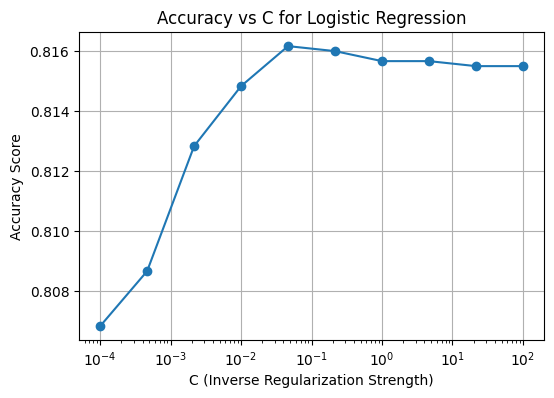

In [38]:
C_values = np.logspace(-4, 2, 10)
accuracies = []

for C in C_values:
    model = LogisticRegression(C=C, max_iter=1000, random_state=42, solver='liblinear')
    model.fit(X_train_scaled_unbalanced, y_train)
    y_pred = model.predict(X_test_scaled_unbalanced)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

plt.figure(figsize=(6, 4))
plt.semilogx(C_values, accuracies, marker='o')
plt.xlabel('C (Inverse Regularization Strength)')
plt.ylabel('Accuracy Score')
plt.title('Accuracy vs C for Logistic Regression')
plt.grid(True)
plt.show()

##### **4.1.4 Hyperparameter Optimization via Grid Search**

In [ ]:
pipe = Pipeline([ 
    ('pca', PCA(n_components=.95)),  
    ('logistic', LogisticRegression(random_state=42, max_iter=1000, C=0.01))
])

param_grid = {
    'logistic__C': [0.001, 0.01, 0.1, 1, 10],
    'logistic__penalty': ['l1', 'l2'],  
    'logistic__solver': ['liblinear']  # 'liblinear' supports both 'l1' and 'l2' penalties
}

grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train_scaled_unbalanced, y_train)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation F1 score: {grid_search.best_score_:.4f}")
print(classification_report(y_test, grid_search.predict(X_test_scaled_unbalanced)))

plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, grid_search.predict(X_test_scaled_unbalanced)), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Logistic Regression', fontsize=12)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

Best parameters: {'logistic__C': 1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.4472
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      4687
           1       0.67      0.32      0.43      1313

    accuracy                           0.82      6000
   macro avg       0.75      0.64      0.66      6000
weighted avg       0.80      0.82      0.79      6000



In [ ]:
# it is very clear that logistic regression is not performing well on this dataset. reason is target variable is imbalanced.
# we need to use SMOTE or any other options to balance the target variable.

##### **4.1.5 Model Evaluation on Combined Datasets**

In [34]:
logic_parameters = ['C', 'penalty', 'solver']

logic_pipe = Pipeline([  
        ('logistic', LogisticRegression(random_state=42, max_iter=1000, C=0.01))
    ])

logic_param_grid = {
        'logistic__C': [0.001, 0.01, 0.1, 1, 10],
        'logistic__penalty': ['l1', 'l2'],  
        'logistic__solver': ['liblinear']  # 'liblinear' supports both 'l1' and 'l2' penalties
    }

logic_df, logic_cm, logic_auc_roc_scores = model_eval_report(datasets, logic_parameters, logic_param_grid, logic_pipe)
logic_df

Scaled + Unbalanced
Best parameters: {'logistic__C': 10, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.4522
Scaled + Unbalanced + PCA
Best parameters: {'logistic__C': 10, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.4479
Scaled + Balanced
Best parameters: {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.7101
Scaled + Balanced + PCA
Best parameters: {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}
Best cross-validation F1 score: 0.6536


,model_name,dataset_name,accuracy_score,precision_score,recall_score,f1_score,hyper_parameters,time_taken(s)
0,LogisticRegression,Scaled + Unbalanced,0.815500,0.661950,0.320640,0.432016,"[(C, 10), (penalty, l2), (solver, liblinear)]",19.406229
1,LogisticRegression,Scaled + Unbalanced + PCA,0.816500,0.669329,0.319117,0.432182,"[(C, 10), (penalty, l2), (solver, liblinear)]",1.178791
2,LogisticRegression,Scaled + Balanced,0.790167,0.520362,0.525514,0.522925,"[(C, 0.1), (penalty, l2), (solver, liblinear)]",91.600177
3,LogisticRegression,Scaled + Balanced + PCA,0.779333,0.496316,0.564356,0.528154,"[(C, 0.1), (penalty, l2), (solver, liblinear)]",1.881019


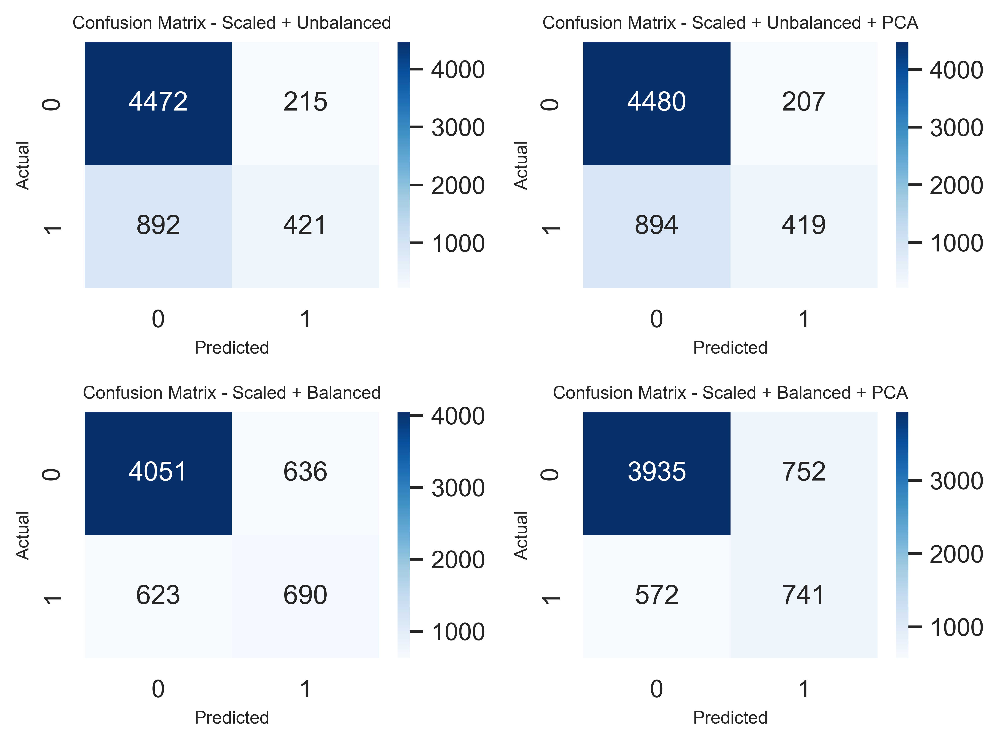

In [77]:
plot_cm(logic_cm)

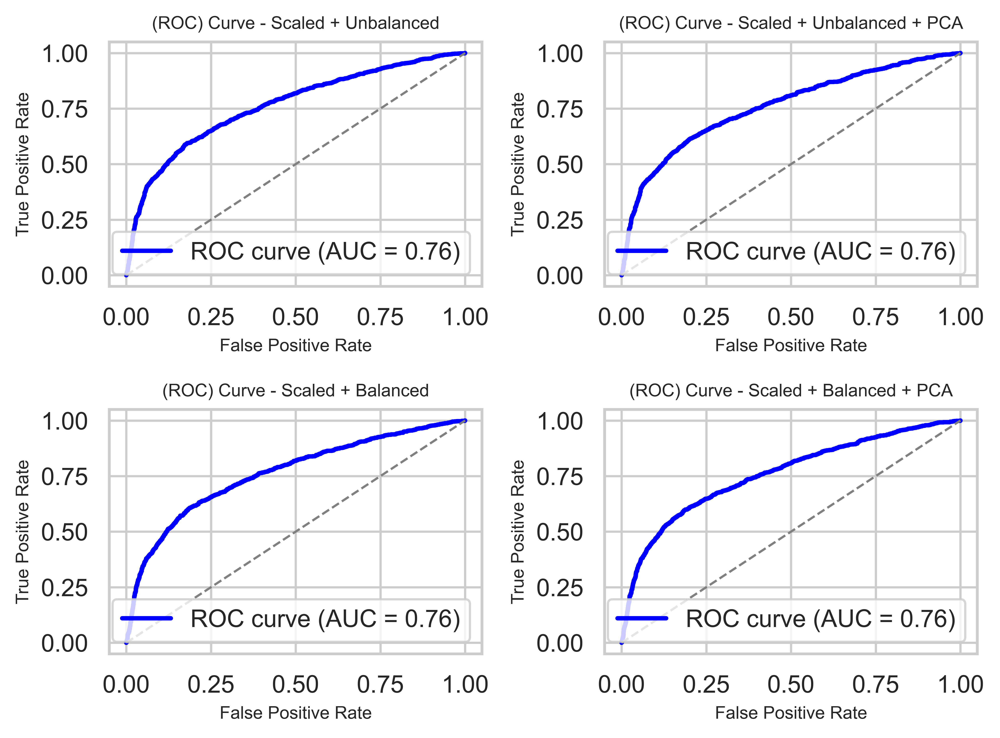

In [78]:
plot_roc_curve(logic_auc_roc_scores)

In [99]:
# logic_scores = defaultdict(list)
# logic_parameters = ['C', 'penalty', 'solver']
# confusion_matrix_list = []
# roc_auc_scores = []

# for dataset_name, dataset_X_y in datasets.items():
#     X_train, X_test, y_train, y_test = dataset_X_y

#     pipe = Pipeline([  
#         ('logistic', LogisticRegression(random_state=42, max_iter=1000, C=0.01))
#     ])

#     param_grid = {
#         'logistic__C': [0.001, 0.01, 0.1, 1, 10],
#         'logistic__penalty': ['l1', 'l2'],  
#         'logistic__solver': ['liblinear']  # 'liblinear' supports both 'l1' and 'l2' penalties
#     }

#     grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='f1', n_jobs=-1)
#     grid_search.fit(X_train, y_train)
#     y_pred = grid_search.predict(X_test)
#     y_scores = grid_search.predict_proba((X_test))[:, 1]
#     best_parameters = list(zip(logic_parameters, [p for p in grid_search.best_params_.values()]))

#     logic_scores['dataset_name'].append(dataset_name)
#     logic_scores['accuracy_score'].append(accuracy_score(y_test, y_pred))
#     logic_scores['precision_score'].append(precision_score(y_test, y_pred))
#     logic_scores['recall_score'].append(recall_score(y_test, y_pred))
#     logic_scores['f1_score'].append(f1_score(y_test, y_pred))
#     logic_scores['hyper_parameters'].append(best_parameters)

#     confusion_matrix_list.append((dataset_name, confusion_matrix(y_test, y_pred)))
#     roc_auc_scores.append((dataset_name, roc_curve(y_test, y_scores)))


    

# logic_scores_df = pd.DataFrame(logic_scores)
# logic_scores_df

In [100]:
# fig, ax = plt.subplots(2, 2, dpi=800)
# axes = ax.flatten()
# for idx, cm in enumerate(confusion_matrix_list):
#     sns.heatmap(cm[1], annot=True, fmt='d', cmap='Blues', ax=axes[idx])
#     axes[idx].set_title(f'Confusion Matrix - {cm[0]}', fontsize=8)
#     axes[idx].set_xlabel('Predicted', fontsize=8)
#     axes[idx].set_ylabel('Actual', fontsize=8)
#     plt.tight_layout()
    


In [102]:
# fig, ax = plt.subplots(2, 2, dpi=800)
# axes = ax.flatten()
# for item in roc_auc_scores:
#     fpr, tpr, threshold = item[1]
#     roc_auc = auc(fpr, tpr)
#     plt.figure(figsize=(8, 6))
#     plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
#     plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.title(f'Receiver Operating Characteristic (ROC) Curve - {item[0]}')
#     plt.legend(loc='lower right')
#     plt.grid(True)
#     plt.show()


#### **4.2 Random Forest Classifier**

##### **4.2.1 Baseline Model Training**

In [42]:
rf = RandomForestClassifier(random_state=42, class_weight='balanced')
rf.fit(X_train_scaled_unbalanced, y_train)
y_pred = rf.predict(X_test_scaled_unbalanced)
print(classification_report(y_test, y_pred))
y_pred_prob = rf.predict_proba(X_test_scaled_unbalanced)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"AUC Score: {roc_auc}")

              precision    recall  f1-score   support

           0       0.84      0.95      0.89      4687
           1       0.64      0.34      0.45      1313

    accuracy                           0.81      6000
   macro avg       0.74      0.65      0.67      6000
weighted avg       0.79      0.81      0.79      6000

AUC Score: 0.7579057531559396


##### **4.2.2 Hyperparameter Settings**

              precision    recall  f1-score   support

           0       0.88      0.83      0.85      4687
           1       0.49      0.58      0.53      1313

    accuracy                           0.78      6000
   macro avg       0.68      0.71      0.69      6000
weighted avg       0.79      0.78      0.78      6000

ROC AUC Score: 0.7787


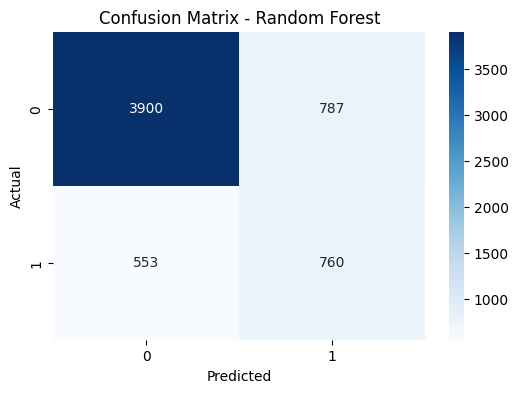

In [44]:
rf = RandomForestClassifier(
    class_weight='balanced',
    n_estimators=200,        # More trees
    max_depth=10,            # Prevent overfitting
    min_samples_split=10,    # Require more samples to split
    min_samples_leaf=5,      # Require more samples in leaves
    random_state=42
)

rf.fit(X_train_scaled_unbalanced, y_train)
y_pred = rf.predict(X_test_scaled_unbalanced)
print(classification_report(y_test, y_pred))
y_pred_prob = rf.predict_proba(X_test_scaled_unbalanced)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"ROC AUC Score: {roc_auc:.4f}")

plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Random Forest', fontsize=12)
plt.xlabel('Predicted', fontsize=10)
plt.ylabel('Actual', fontsize=10)
plt.show()

##### **4.2.3 Hyperparameter Optimization via Grid Search Plus Model Evaluation on Combined Datasets**

In [37]:
parameters_rf = ['estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf']

param_grid_rf = {
            'rf__n_estimators': [100, 200],
            'rf__max_depth': [None, 10, 20],
            'rf__min_samples_split': [2, 5, 10],
            'rf__min_samples_leaf': [1, 2, 5]
        }
    
pipe_rf = Pipeline([
            # ('scaler', StandardScaler()),
            # ('pca', PCA(n_components=10)),
            ('rf', RandomForestClassifier(random_state=42, class_weight='balanced'))
        ])

rf_df, rf_cm, rf_roc_auc_scores = model_eval_report(datasets, parameters_rf, param_grid_rf, pipe_rf)
rf_df

Scaled + Unbalanced
Best parameters: {'rf__max_depth': 10, 'rf__min_samples_leaf': 2, 'rf__min_samples_split': 2, 'rf__n_estimators': 200}
Best cross-validation F1 score: 0.5450
Scaled + Unbalanced + PCA
Best parameters: {'rf__max_depth': 10, 'rf__min_samples_leaf': 5, 'rf__min_samples_split': 2, 'rf__n_estimators': 200}
Best cross-validation F1 score: 0.5365
Scaled + Balanced
Best parameters: {'rf__max_depth': None, 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 2, 'rf__n_estimators': 200}
Best cross-validation F1 score: 0.8522
Scaled + Balanced + PCA
Best parameters: {'rf__max_depth': None, 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 2, 'rf__n_estimators': 200}
Best cross-validation F1 score: 0.8307


,model_name,dataset_name,accuracy_score,precision_score,recall_score,f1_score,hyper_parameters,time_taken(s)
0,RandomForestClassifier,Scaled + Unbalanced,0.779667,0.496974,0.562833,0.527857,"[(estimators, 10), (max_depth, 2), (min_sample...",485.623250
1,RandomForestClassifier,Scaled + Unbalanced + PCA,0.783500,0.504834,0.556740,0.529518,"[(estimators, 10), (max_depth, 5), (min_sample...",1103.414245
2,RandomForestClassifier,Scaled + Balanced,0.792167,0.527500,0.482102,0.503780,"[(estimators, None), (max_depth, 1), (min_samp...",1596.897860
3,RandomForestClassifier,Scaled + Balanced + PCA,0.773833,0.484529,0.524752,0.503839,"[(estimators, None), (max_depth, 1), (min_samp...",1476.410352


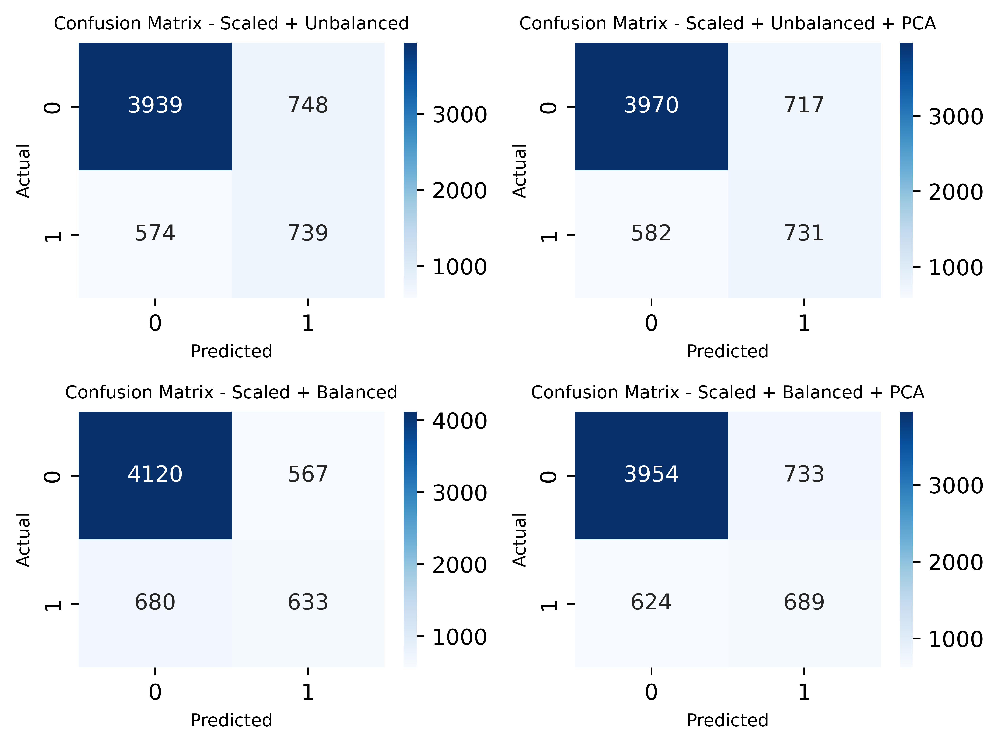

In [ ]:
plot_cm(rf_cm)

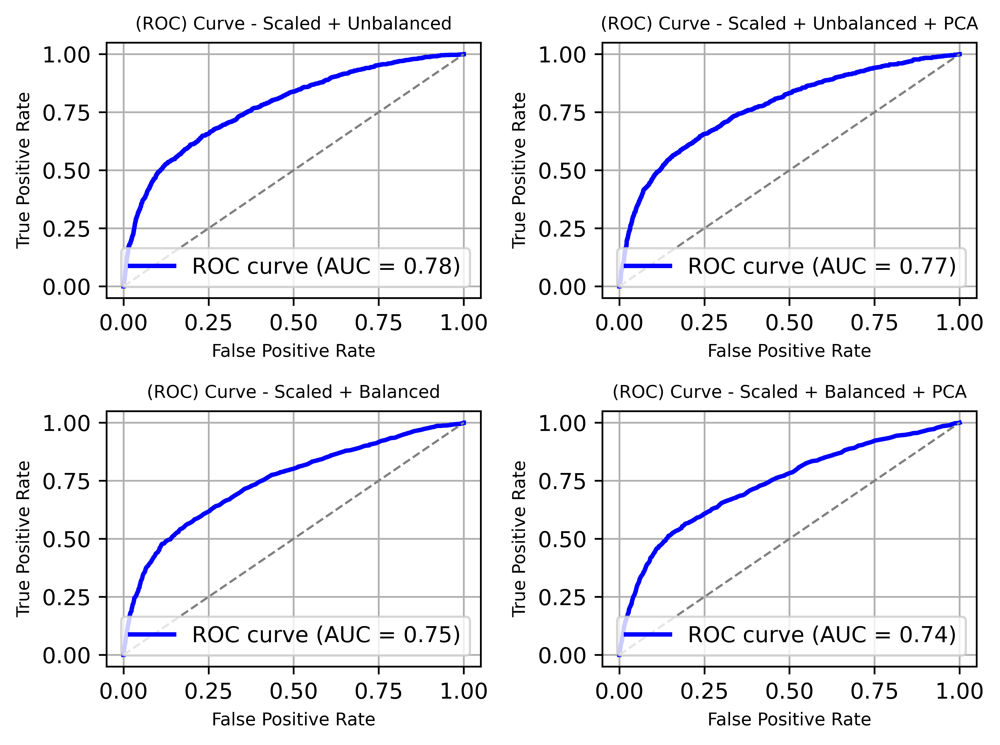

In [ ]:
plot_roc_curve(rf_roc_auc_scores)

#### **4.3 SVM**

##### **4.3.1 Baseline SVM Model**

In [121]:
svm = SVC(kernel='sigmoid')
svm.fit(X_train_scaled_unbalanced, y_train)
y_pred = svm.predict(X_test_scaled_unbalanced)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.82      0.82      4687
           1       0.37      0.37      0.37      1313

    accuracy                           0.72      6000
   macro avg       0.60      0.60      0.60      6000
weighted avg       0.72      0.72      0.72      6000



##### **4.3.2 Hyperparameter Tuning and Gridsearch on Combined Datasets**

In [ ]:
svm_pipe = Pipeline([
    ('svm', SVC())
])

svm_param_grid = {
    'svm__C': [0.1, 1, 10, 100],
    'svm__gamma': [0.001, 0.01, 0.1, 1],
    'svm__kernel': ['linear', 'rbf', 'sigmoid']
}

svm_parameters = ['C', 'gamma', 'kernel']

svm_df, svm_cm, svm_roc_auc_scores = model_eval_report(datasets, svm_parameters, svm_param_grid, svm_pipe)

svm_df


In [ ]:
plot_cm(svm_cm)

In [ ]:
plot_roc_curve(svm_roc_auc_scores)

#### **4.4 KNN**

##### **4.4.1 KNN Basemodel Training**

In [123]:
knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train_scaled_balanced_pca, y_train_scaled_balanced_pca)

y_pred = knn.predict(X_test_scaled_balanced_pca)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.69      0.77      4687
           1       0.36      0.61      0.45      1313

    accuracy                           0.67      6000
   macro avg       0.61      0.65      0.61      6000
weighted avg       0.75      0.67      0.70      6000



##### **4.4.2 Model Training with Hypertuning and Evaluation on Combined Datasets**

In [41]:
knn_pipe = Pipeline([
    ('knn', KNeighborsClassifier())  
])

knn_param_grid = {
    'knn__n_neighbors': list(range(1, 31)),
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan'],
    'knn__p': [1, 2]
}

knn_parameters = ['n_neighbors', 'weights', 'metric', 'p']

knn_df, knn_cm, knn_roc_auc_scores = model_eval_report(datasets, knn_parameters, knn_param_grid, knn_pipe)

knn_df

Scaled + Unbalanced
Best parameters: {'knn__metric': 'euclidean', 'knn__n_neighbors': 28, 'knn__p': 1, 'knn__weights': 'distance'}
Best cross-validation F1 score: 0.4639
Scaled + Unbalanced + PCA
Best parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 21, 'knn__p': 1, 'knn__weights': 'distance'}
Best cross-validation F1 score: 0.4685
Scaled + Balanced
Best parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 1, 'knn__p': 1, 'knn__weights': 'uniform'}
Best cross-validation F1 score: 0.8510
Scaled + Balanced + PCA
Best parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 1, 'knn__p': 1, 'knn__weights': 'uniform'}
Best cross-validation F1 score: 0.8330


,model_name,dataset_name,accuracy_score,precision_score,recall_score,f1_score,hyper_parameters,time_taken(s)
0,KNeighborsClassifier,Scaled + Unbalanced,0.813500,0.633242,0.351104,0.451739,"[(n_neighbors, euclidean), (weights, 28), (met...",647.849248
1,KNeighborsClassifier,Scaled + Unbalanced + PCA,0.812833,0.628378,0.354151,0.452996,"[(n_neighbors, manhattan), (weights, 21), (met...",454.914441
2,KNeighborsClassifier,Scaled + Balanced,0.703000,0.361815,0.467631,0.407973,"[(n_neighbors, manhattan), (weights, 1), (metr...",1592.442499
3,KNeighborsClassifier,Scaled + Balanced + PCA,0.688000,0.347850,0.486672,0.405714,"[(n_neighbors, manhattan), (weights, 1), (metr...",723.602844


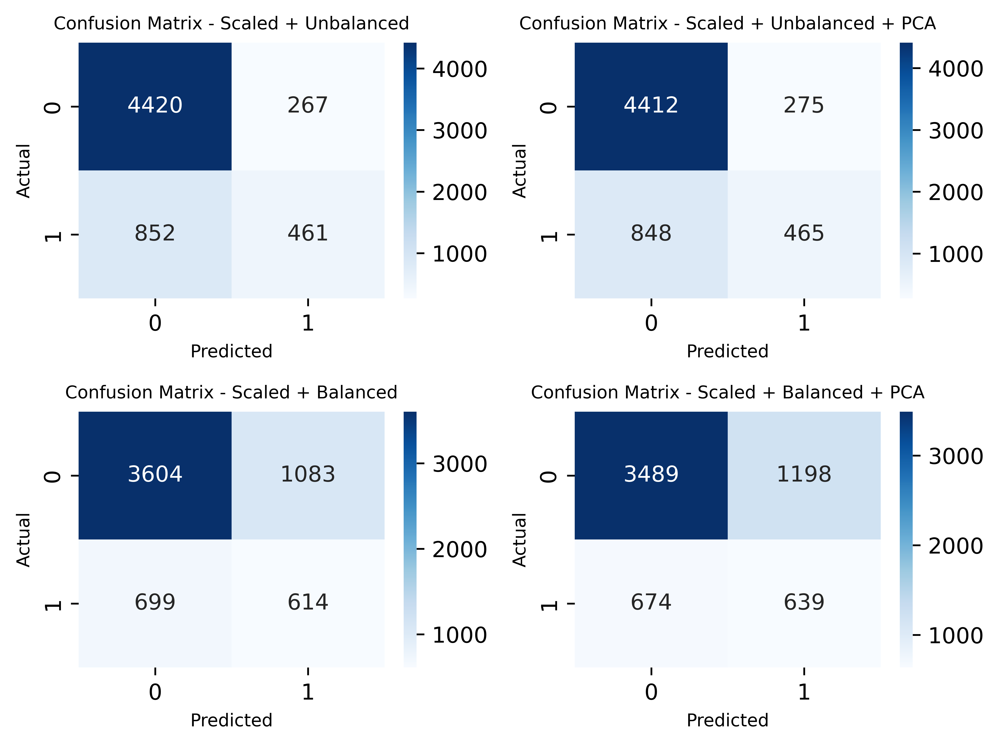

In [41]:
plot_cm(knn_cm)

#### **4.5 Decision Tree**

##### **4.5.1 Decision Tree Basemodel Training**

In [124]:
dt = DecisionTreeClassifier(max_depth=5)
dt.fit(X_train_scaled_balanced, y_train_scaled_balanced)
y_pred = dt.predict(X_test_scaled_balanced)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.70      0.78      4687
           1       0.38      0.66      0.48      1313

    accuracy                           0.69      6000
   macro avg       0.63      0.68      0.63      6000
weighted avg       0.77      0.69      0.72      6000



##### **4.5.2 Model Traning and Evaluation on Combined Datasets**

In [35]:
dt_pipe = Pipeline([
    ('dt', DecisionTreeClassifier())
])

dt_param_grid = {
    'dt__max_depth': [2, 4, 6, 8],
    'dt__min_samples_split': [2, 5, 10],
    'dt__criterion': ['gini', 'entropy']
}

dt_parameters = ['max_depth', 'min_samples_split', 'criterion']

dt_df, dt_cm, dt_roc_auc_scores = model_eval_report(datasets, dt_parameters, dt_param_grid, dt_pipe)
dt_df



Scaled + Unbalanced
Best parameters: {'dt__criterion': 'gini', 'dt__max_depth': 4, 'dt__min_samples_split': 2}
Best cross-validation F1 score: 0.4748
Scaled + Unbalanced + PCA
Best parameters: {'dt__criterion': 'gini', 'dt__max_depth': 4, 'dt__min_samples_split': 2}
Best cross-validation F1 score: 0.4931
Scaled + Balanced
Best parameters: {'dt__criterion': 'gini', 'dt__max_depth': 8, 'dt__min_samples_split': 2}
Best cross-validation F1 score: 0.7115
Scaled + Balanced + PCA
Best parameters: {'dt__criterion': 'gini', 'dt__max_depth': 8, 'dt__min_samples_split': 5}
Best cross-validation F1 score: 0.7002


,model_name,dataset_name,accuracy_score,precision_score,recall_score,f1_score,hyper_parameters,time_taken(s)
0,DecisionTreeClassifier,Scaled + Unbalanced,0.820833,0.667135,0.361767,0.469136,"[(max_depth, gini), (min_samples_split, 4), (c...",4.677218
1,DecisionTreeClassifier,Scaled + Unbalanced + PCA,0.813000,0.616891,0.383854,0.473239,"[(max_depth, gini), (min_samples_split, 4), (c...",8.653297
2,DecisionTreeClassifier,Scaled + Balanced,0.730000,0.415982,0.578827,0.484076,"[(max_depth, gini), (min_samples_split, 8), (c...",13.544756
3,DecisionTreeClassifier,Scaled + Balanced + PCA,0.728500,0.414317,0.581874,0.484004,"[(max_depth, gini), (min_samples_split, 8), (c...",13.979253


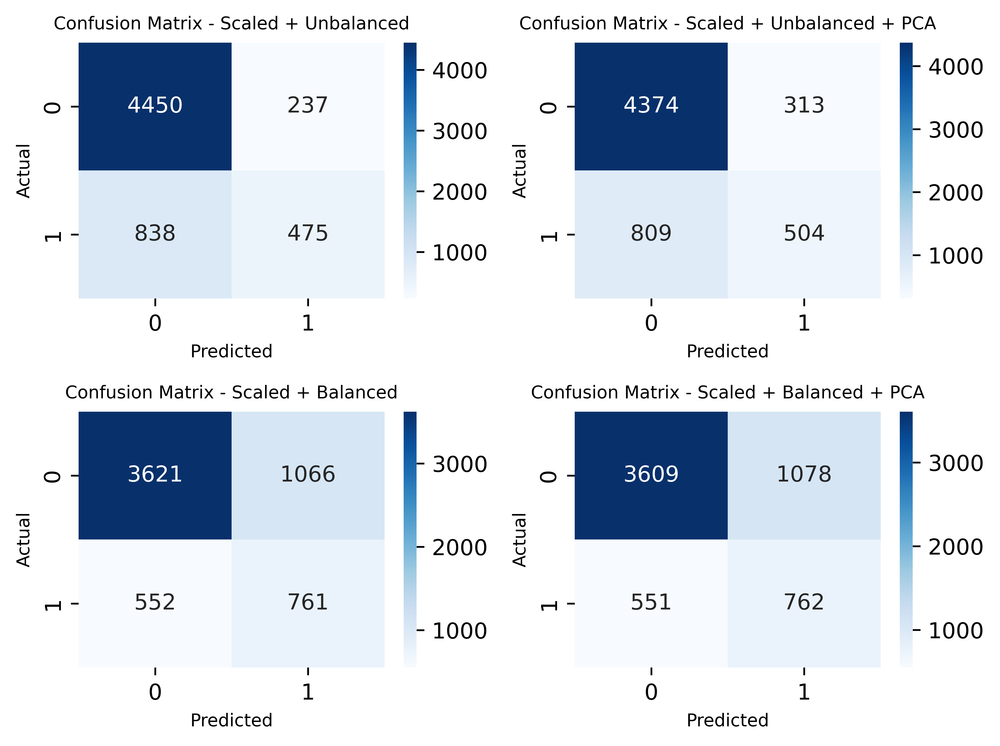

In [38]:
plot_cm(dt_cm)

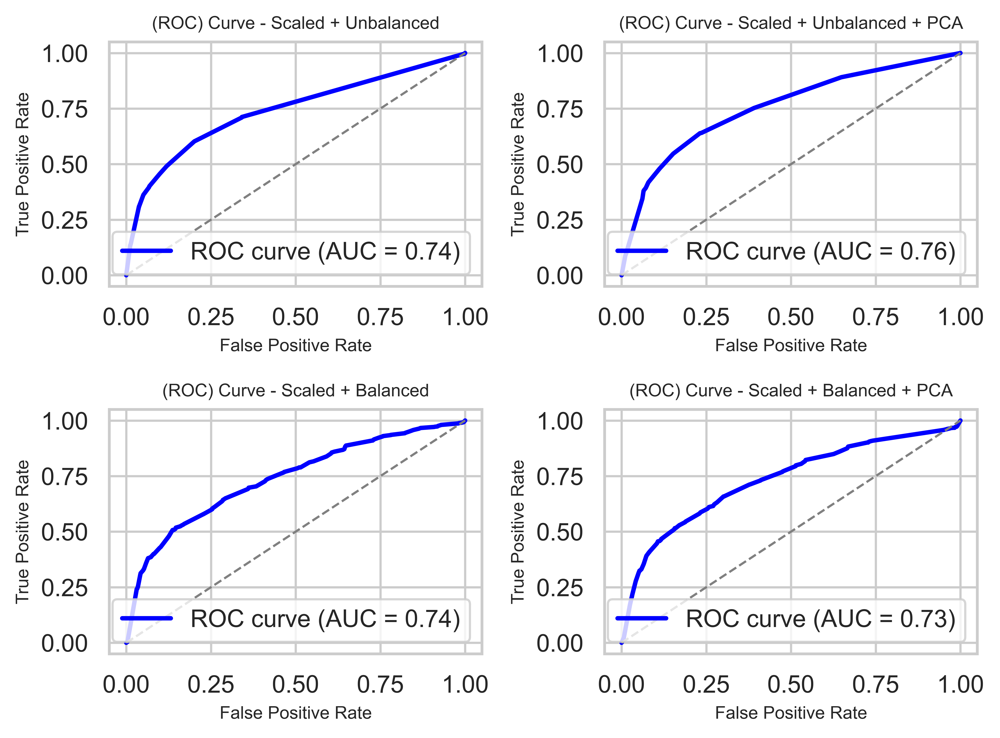

In [36]:
plot_roc_curve(dt_roc_auc_scores)

#### **4.6 XGBoost (eXtreme Gradient Boosting) - Optional**

In [81]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, roc_auc_score

# Basic XGBoost Classifier
xgb_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss' 
)

# For imbalanced data - better approach
xgb_model = XGBClassifier(
    scale_pos_weight=10,    
    max_depth=6,
    learning_rate=0.1,
    n_estimators=200,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='auc'       
)

# Fit and predict
xgb_model.fit(X_train_scaled_balanced, y_train_scaled_balanced)
y_pred_xgb = xgb_model.predict(X_test_scaled_balanced)
y_pred_proba_xgb = xgb_model.predict_proba(X_test_scaled_balanced)[:, 1]

In [82]:
print(classification_report(y_test, y_pred_xgb))
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)
print(f"XGBoost ROC AUC Score: {roc_auc_xgb:.4f}")


              precision    recall  f1-score   support

           0       0.92      0.39      0.55      4687
           1       0.29      0.88      0.43      1313

    accuracy                           0.50      6000
   macro avg       0.60      0.63      0.49      6000
weighted avg       0.78      0.50      0.52      6000

XGBoost ROC AUC Score: 0.7508


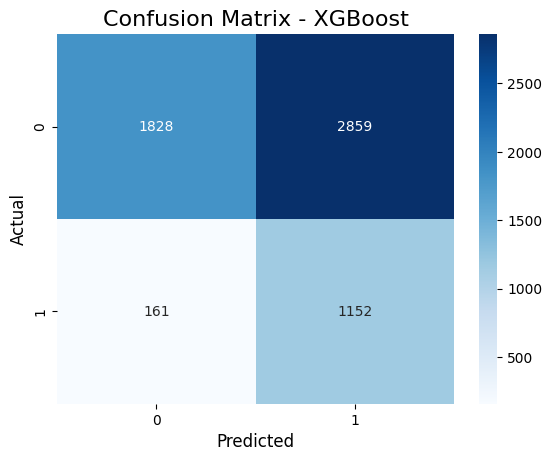

In [83]:
sns.heatmap(confusion_matrix(y_test, y_pred_xgb), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - XGBoost', fontsize=16)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

#### **4.7 LightGBM (Light Gradient Boosting) - Optional**

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83      4687
           1       0.44      0.61      0.51      1313

    accuracy                           0.75      6000
   macro avg       0.66      0.70      0.67      6000
weighted avg       0.78      0.75      0.76      6000

XGBoost ROC AUC Score: 0.7639


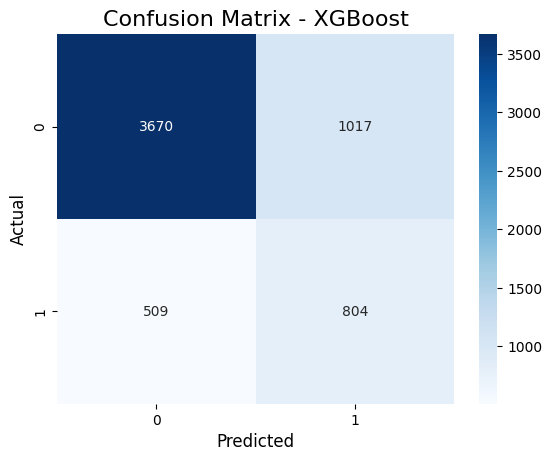

In [86]:
from lightgbm import LGBMClassifier

# Basic LightGBM Classifier
lgb_model = LGBMClassifier(
    random_state=42,
    verbose=-1  
)

# For imbalanced data
lgb_model = LGBMClassifier(
    class_weight='balanced',  # Auto balance classes
    max_depth=6,
    learning_rate=0.1,
    n_estimators=200,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    verbose=-1
)

# Fit and predict
lgb_model.fit(X_train_scaled_balanced_pca, y_train_scaled_balanced_pca)
y_pred_lgb = lgb_model.predict(X_test_scaled_balanced_pca)
y_pred_proba_lgb = lgb_model.predict_proba(X_test_scaled_balanced_pca)[:, 1]

print("XGBoost Classification Report:")
print(classification_report(y_test, y_pred_lgb))

print(f"XGBoost ROC AUC Score: {roc_auc_score(y_test, y_pred_proba_lgb):.4f}")


sns.heatmap(confusion_matrix(y_test, y_pred_lgb), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - XGBoost', fontsize=16)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

## **5. Model Evaluation & Validation**

In [ ]:
# Let's plot scores agains models and hyper parameters

In [42]:
final_evaluation_report = pd.concat([logic_df, rf_df, dt_df, knn_df])

In [57]:
final_evaluation_report.to_excel(r"model_comparisons.xlsx", index=False)

In [43]:
final_evaluation_report

,model_name,dataset_name,accuracy_score,precision_score,recall_score,f1_score,hyper_parameters,time_taken(s)
0,LogisticRegression,Scaled + Unbalanced,0.815500,0.661950,0.320640,0.432016,"[(C, 10), (penalty, l2), (solver, liblinear)]",19.406229
1,LogisticRegression,Scaled + Unbalanced + PCA,0.816500,0.669329,0.319117,0.432182,"[(C, 10), (penalty, l2), (solver, liblinear)]",1.178791
2,LogisticRegression,Scaled + Balanced,0.790167,0.520362,0.525514,0.522925,"[(C, 0.1), (penalty, l2), (solver, liblinear)]",91.600177
3,LogisticRegression,Scaled + Balanced + PCA,0.779333,0.496316,0.564356,0.528154,"[(C, 0.1), (penalty, l2), (solver, liblinear)]",1.881019
0,RandomForestClassifier,Scaled + Unbalanced,0.779667,0.496974,0.562833,0.527857,"[(estimators, 10), (max_depth, 2), (min_sample...",485.623250
1,RandomForestClassifier,Scaled + Unbalanced + PCA,0.783500,0.504834,0.556740,0.529518,"[(estimators, 10), (max_depth, 5), (min_sample...",1103.414245
2,RandomForestClassifier,Scaled + Balanced,0.792167,0.527500,0.482102,0.503780,"[(estimators, None), (max_depth, 1), (min_samp...",1596.897860
3,RandomForestClassifier,Scaled + Balanced + PCA,0.773833,0.484529,0.524752,0.503839,"[(estimators, None), (max_depth, 1), (min_samp...",1476.410352
0,DecisionTreeClassifier,Scaled + Unbalanced,0.820833,0.667135,0.361767,0.469136,"[(max_depth, gini), (min_samples_split, 4), (c...",4.677218
1,DecisionTreeClassifier,Scaled + Unbalanced + PCA,0.813000,0.616891,0.383854,0.473239,"[(max_depth, gini), (min_samples_split, 4), (c...",8.653297


##### **5.1 F1-Score Comparison Across Datasets and Algorithms**

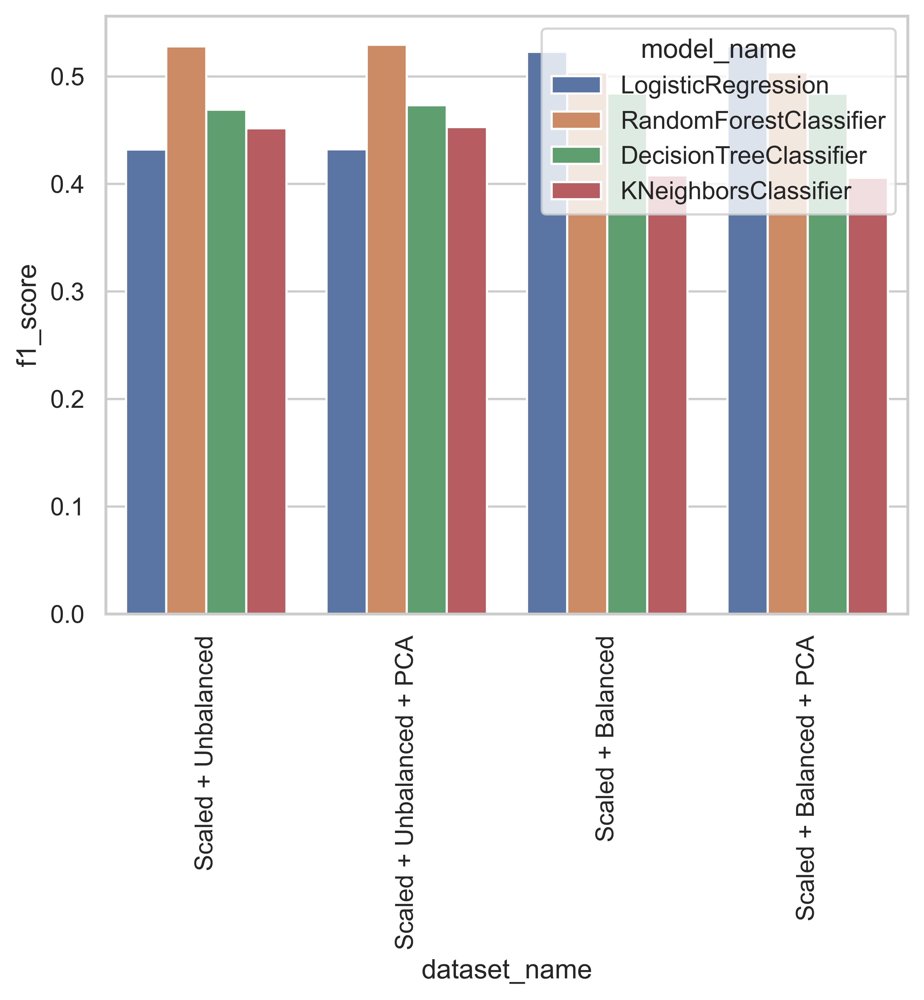

In [44]:
sns.set_theme(style='whitegrid', palette='deep')
plt.figure(dpi=800)
sns.barplot(final_evaluation_report, x='dataset_name', y='f1_score', hue='model_name')
plt.xticks(rotation=90)
plt.show()

##### **5.2 Model Performance vs. Training Time**

In [60]:
final_evaluation_report.groupby('model_name')['time_taken(s)'].sum()

model_name
DecisionTreeClassifier      40.854524
KNeighborsClassifier      3418.809032
LogisticRegression         114.066216
RandomForestClassifier    4662.345707
Name: time_taken(s), dtype: float64

[]

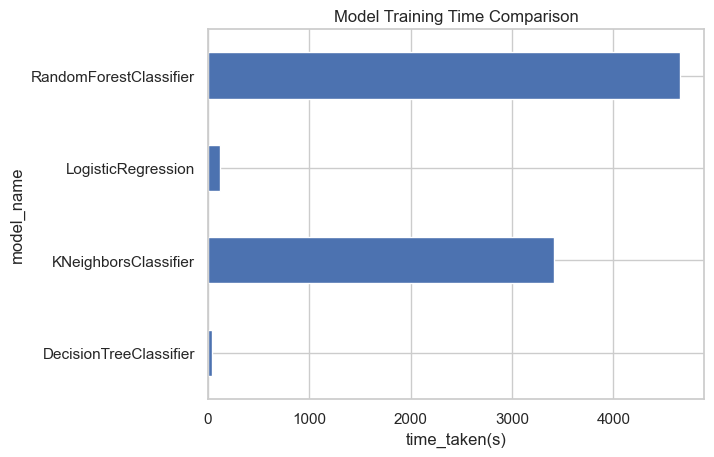

In [45]:
sns.set_theme(style='whitegrid')
final_evaluation_report.groupby('model_name')['time_taken(s)'].sum().plot.barh()
plt.title("Model Training Time Comparison")
plt.xlabel('time_taken(s)')
plt.plot()

##### **5.3 AUC Score Comparison Across Datasets & Machine Learning Models**

In [52]:
auc_values = defaultdict(list)
algorithms = ['RandomForest', 'KNN', 'DecisionTree', 'LogisticRegression']
auc_scores = [rf_roc_auc_scores, knn_roc_auc_scores, dt_roc_auc_scores, logic_auc_roc_scores]
for algo, item in zip(algorithms, auc_scores):
    for dataset_name, score in item:
        fpr, tpr, threshold = score
        roc_auc = auc(fpr, tpr)
        auc_values['alogorithm'].append(algo)
        auc_values['dataset_name'].append(dataset_name)
        auc_values['auc'].append(roc_auc)

In [59]:
pd.DataFrame(auc_values).to_excel("auc_comparisons.xlsx", index=False)

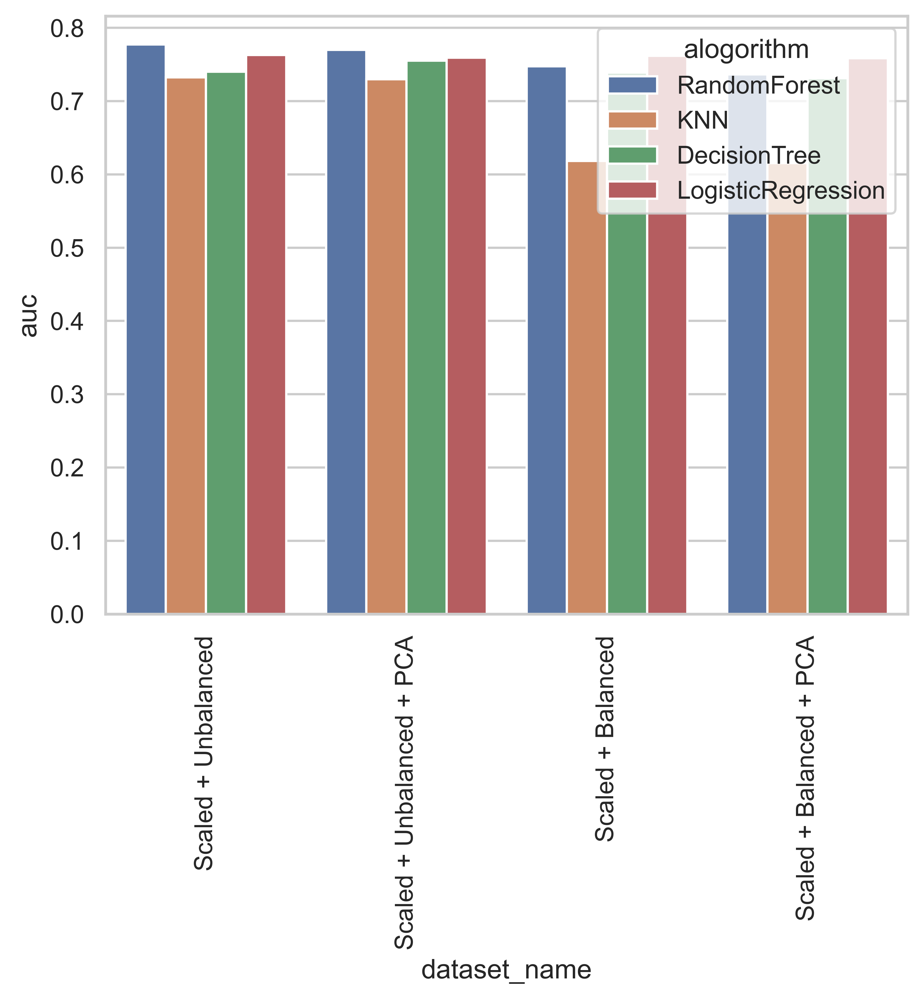

In [58]:
plt.figure(dpi=600)
sns.barplot(data=pd.DataFrame(auc_values), x='dataset_name', y='auc', hue='alogorithm')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# ref:https://www.statology.org/what-is-a-good-auc-score/

✅ Based on AUC, Decision Tree and Logistic Regression, Random Forest are showing fair model quality

| AUC Score | Model Quality |
|-----------|----------------|
| 0.5       | No discrimination (random guessing) |
| 0.6–0.7   | Poor |
| 0.7–0.8   | Fair |
| 0.8–0.9   | Good |
| 0.9–1.0   | Excellent |

## **6 Conclusion**

In this project, we aimed to predict the likelihood of default on the next payment by credit card holders using a sample dataset. After performing initial data cleansing, we conducted exploratory data analysis (EDA) to uncover patterns, detect anomalies, assess correlations with the target variable, and identify multicollinearity among features.

We then applied a comprehensive preprocessing pipeline that included feature selection, feature extraction, scaling, and normalization. Multiple supervised classification algorithms were trained on various dataset versions created during preprocessing. To address class imbalance, we employed techniques such as SMOTE to improve minority class representation.

Despite these efforts, the models did not yield highly satisfactory results. While algorithms like **Logistic Regression** and ensemble algorithm **Random Forest** showed moderate performance, the recall for the minority class remained low. This could be attributed to the limited size of the dataset and the inherent volatility of financial behavior. To enhance predictive accuracy, future work should consider incorporating additional features—such as behavioral, transactional, or macroeconomic indicators—and possibly expanding the dataset to better capture the complexity of credit default patterns.
